# Radio Link Failure Prediction Challenge

In [1]:
!pip install wget

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=dda5a978efcc8c0a376c4d3c2afc686f239b2c2bb47c3d25336205aa01285832
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget


In [2]:
!pip install XGBoost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
!pip install py7zr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 65 kB 2.6 MB/s 
     |████████████████████████████████| 94 kB 2.9 MB/s 
     |████████████████████████████████| 139 kB 74.1 MB/s 
     |████████████████████████████████| 2.3 MB 51.6 MB/s 
     |████████████████████████████████| 357 kB 63.9 MB/s 
     |████████████████████████████████| 50 kB 6.3 MB/s 
     |████████████████████████████████| 378 kB 47.7 MB/s 


In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers



import pandas as pd
from zipfile import ZipFile
import wget
import py7zr

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn import svm, datasets
from sklearn.model_selection import GridSearchCV

from keras.wrappers.scikit_learn import KerasClassifier

from xgboost import XGBClassifier, plot_importance

from matplotlib import pyplot as plt


Based on template available here: https://github.com/Turkcell/ITU-AIMLin5GChallenge-2021/blob/4938c53979d650f94d5208ff4cb977ea954b6907/RLF_Prediction_ITU_AIML_Challenge_Data/TurkcellExampleProject.ipynb

## Processing the Data

In [8]:
filename = wget.download('https://github.com/Turkcell/ITU-AIMLin5GChallenge-2021/raw/main/RLF_Prediction_ITU_AIML_Challenge_Data/RLF_Prediction_ITU_AIML_Challenge_Data.7z')

In [9]:
archive = py7zr.SevenZipFile('RLF_Prediction_ITU_AIML_Challenge_Data.7z', mode='r')
archive.extractall()
archive.close()

In [2]:
#Read the Data
data_zip_path = "RLF_Prediction_ITU_AIML_Challenge_Data/RegionA.zip"
# Zip file reading
def read_table_from_zip(zip_path, table_name):
    with ZipFile(zip_path) as zip_file:
        with zip_file.open(table_name) as file:
            df = pd.read_csv(file, sep="\t", index_col=0)
            if "datetime" in df:
                df["datetime"] = pd.to_datetime(df["datetime"])
            return df

In [3]:
#Read rl-kpis
rl_kpis = read_table_from_zip(data_zip_path, "rl-kpis.tsv")
print(f"rl_kpis.shape: {rl_kpis.shape}")
rl_kpis.head()

rl_kpis.shape: (1992986, 18)


,type,datetime,tip,mlid,mw_connection_no,site_id,card_type,adaptive_modulation,freq_band,severaly_error_second,error_second,unavail_second,avail_time,bbe,rxlevmax,capacity,modulation,rlf
0,ENK,2018-12-31,FAR,A0BE,"1,349,988",RL_;ABDV,cardtype1,Enable,f3,0.0,0.0,0.0,86.4,0.0,-31.0,456.0,1024QAM,False
1,ENK,2018-12-31,FAR,A0BI,"1,349,988",RL_;ABDV,cardtype1,Enable,f3,0.0,0.0,0.0,86.4,0.0,-30.7,456.0,1024QAM,False
2,ENK,2018-12-31,FAR,A5AB,"1,344,018",RL_;ABDV,cardtype4,Enable,f3,0.0,0.0,0.0,86.4,0.0,-34.4,406.0,512QAM,False
3,NEC,2018-12-31,FAR,A8CQ,"1,351,204",RL_;ABDV,cardtype5,Enable,f2,0.0,0.0,0.0,86.4,0.0,-35.3,247.0,2048QAM*,False
4,NEC,2018-12-31,FAR,A8DQ,"1,351,204",RL_;ABDV,cardtype5,Enable,f2,0.0,0.0,0.0,86.4,0.0,-35.3,247.0,2048QAM*,False


In [4]:
#Read rl-sites
rl_sites = read_table_from_zip(data_zip_path, "rl-sites.tsv")
print(f"rl-sites.shape: {rl_sites.shape}")
rl_sites.head()

rl-sites.shape: (1674, 3)


,site_id,groundheight,clutter_class
0,RL_;ABDV,107.9658,OPEN LAND
1,RL_;ABL>,97.9733,OPEN LAND
2,RL_;ABTP,3.0446,OPEN LAND
3,RL_;AC?E,85.0143,OPEN LAND
4,RL_;ADKP,192.9800,DENSE TREE


In [5]:
#Read distances
distances = read_table_from_zip(data_zip_path, "distances.tsv")
print(f"distances.shape: {distances.shape}")
distances.head()

distances.shape: (1694, 1694)


,WS_19111,WS_17047,WS_18397,WS_17062,WS_17813,WS_17064,WS_19112,WS_17063,WS_18736,WS_17065,...,RL_]=UC>,RL_]ITCK,RL_[KBDF,RL_X;O@O,RL_b?LMI,RL_]IC?O,RL_S:PQD,RL_JEZWL,RL_LKEII,RL_[EOMJ
WS_19111,0.00000,18.65248,60.37075,41.38519,44.21637,53.29280,57.28976,63.45174,62.78558,54.45858,...,56.29052,39.88633,46.79774,59.53805,42.80078,41.30192,41.46846,47.79698,52.29356,42.63424
WS_17047,18.65248,0.00000,73.44414,57.53957,60.28748,69.69699,73.02779,79.27304,76.94148,69.61372,...,72.02855,55.54109,63.03539,76.02551,58.87189,56.87341,57.53957,63.78482,67.44870,58.62208
WS_18397,60.37075,73.44414,0.00000,23.48214,21.31712,19.65172,15.23841,16.82054,6.57833,11.65780,...,15.07187,22.73271,20.48442,20.40115,21.98328,21.65020,22.81598,18.98556,12.82358,21.98328
WS_17062,41.38519,57.53957,23.48214,0.00000,2.83118,12.15742,15.90457,22.06655,23.23233,13.98936,...,14.98860,3.49734,5.49582,18.40267,1.66540,2.99772,0.91597,6.41179,11.90761,1.49886
WS_17813,44.21637,60.28748,21.31712,2.83118,0.00000,9.49278,13.07339,19.23537,20.65096,11.24145,...,12.15742,5.24601,2.74791,15.73803,1.41559,3.99696,2.74791,3.58061,9.24297,1.66540


In [6]:
#Read met-forecast
met_forecast = read_table_from_zip(data_zip_path, "met-forecast.tsv")
print(f"met-forecast.shape: {met_forecast.shape}")
met_forecast.head()

met-forecast.shape: (20323, 38)


,station_no,datetime,report_time,weather_day1,temp_max_day1,temp_min_day1,humidity_max_day1,humidity_min_day1,wind_dir_day1,wind_speed_day1,...,humidity_min_day4,wind_dir_day4,wind_speed_day4,weather_day5,temp_max_day5,temp_min_day5,humidity_max_day5,humidity_min_day5,wind_dir_day5,wind_speed_day5
0,WS_17047,2018-01-02,evening,heavy rain,10,6,96.0,82.0,6.0,19.0,...,57.0,185.0,12.0,few clouds,14,8,90.0,70.0,210.0,16.0
1,WS_17047,2018-01-02,morning,heavy rain,10,6,96.0,82.0,6.0,19.0,...,57.0,185.0,12.0,few clouds,14,8,90.0,70.0,210.0,16.0
2,WS_17062,2018-01-02,evening,heavy rain,12,9,96.0,80.0,84.0,10.0,...,57.0,114.0,10.0,few clouds,17,10,78.0,67.0,107.0,14.0
3,WS_17062,2018-01-02,morning,heavy rain,12,9,96.0,80.0,84.0,10.0,...,57.0,114.0,10.0,few clouds,17,10,78.0,67.0,107.0,14.0
4,WS_17063,2018-01-02,evening,heavy rain,13,9,95.0,78.0,87.0,10.0,...,57.0,134.0,11.0,few clouds,17,10,78.0,63.0,131.0,14.0


In [7]:
#Read met-stations
met_stations = read_table_from_zip(data_zip_path, "met-stations.tsv")
print(f"met-stations.shape: {met_stations.shape}")
met_stations.head()

met-stations.shape: (20, 3)


,station_no,height,clutter_class
0,WS_17047,381,DENSE TREE
1,WS_17062,5,LOW-MEDIUM URBAN
2,WS_17063,99,AIRPORT
3,WS_17064,18,OPEN IN URBAN
4,WS_17065,123,LOW-SPARSE URBAN


In [8]:
#Preapre Labels
# Firstly, only get unique entry identifiers and RLF column.
# For rl-kpis, unique entry identifiers are 'datetime', 'site_id' and 'mlid'.
df_labels = rl_kpis[["datetime", "site_id", "mlid"]]
df_labels.head()

,datetime,site_id,mlid
0,2018-12-31,RL_;ABDV,A0BE
1,2018-12-31,RL_;ABDV,A0BI
2,2018-12-31,RL_;ABDV,A5AB
3,2018-12-31,RL_;ABDV,A8CQ
4,2018-12-31,RL_;ABDV,A8DQ


In [9]:
#Prepare target days (prediction days)

#  Prepare columns for the following days. We will join data with these columns to find RLF
prediction_interval = 7

for i in range(prediction_interval):
  df_labels[f"T+{i+1}"] = df_labels["datetime"] + pd.DateOffset(days=i+1)
df_labels.head()

C:\Users\gueyed\AppData\Local\Temp\1\ipykernel_12472\601314194.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_labels[f"T+{i+1}"] = df_labels["datetime"] + pd.DateOffset(days=i+1)
C:\Users\gueyed\AppData\Local\Temp\1\ipykernel_12472\601314194.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_labels[f"T+{i+1}"] = df_labels["datetime"] + pd.DateOffset(days=i+1)
C:\Users\gueyed\AppData\Local\Temp\1\ipykernel_12472\601314194.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a s

,datetime,site_id,mlid,T+1,T+2,T+3,T+4,T+5,T+6,T+7
0,2018-12-31,RL_;ABDV,A0BE,2019-01-01,2019-01-02,2019-01-03,2019-01-04,2019-01-05,2019-01-06,2019-01-07
1,2018-12-31,RL_;ABDV,A0BI,2019-01-01,2019-01-02,2019-01-03,2019-01-04,2019-01-05,2019-01-06,2019-01-07
2,2018-12-31,RL_;ABDV,A5AB,2019-01-01,2019-01-02,2019-01-03,2019-01-04,2019-01-05,2019-01-06,2019-01-07
3,2018-12-31,RL_;ABDV,A8CQ,2019-01-01,2019-01-02,2019-01-03,2019-01-04,2019-01-05,2019-01-06,2019-01-07
4,2018-12-31,RL_;ABDV,A8DQ,2019-01-01,2019-01-02,2019-01-03,2019-01-04,2019-01-05,2019-01-06,2019-01-07


In [10]:
#Join dataset to get RLF colunms for the target days
rl_kpis_view = rl_kpis[["datetime", "site_id", "mlid", "rlf"]]
for i in range(prediction_interval):
  target_day_column_name = f"T+{i+1}"

  df_labels = df_labels.merge(rl_kpis_view, 
                  how = "left", 
                  left_on = ("site_id", "mlid", target_day_column_name),
                  right_on = ("site_id", "mlid", "datetime"),
                  suffixes = ("", "_y")
  )
  df_labels.rename(columns={"rlf": f"{target_day_column_name}_rlf"}, inplace=True)
df_labels.drop(columns=["datetime_y"], inplace=True)
df_labels.head()

,datetime,site_id,mlid,T+1,T+2,T+3,T+4,T+5,T+6,T+7,T+1_rlf,T+2_rlf,T+3_rlf,T+4_rlf,T+5_rlf,T+6_rlf,T+7_rlf
0,2018-12-31,RL_;ABDV,A0BE,2019-01-01,2019-01-02,2019-01-03,2019-01-04,2019-01-05,2019-01-06,2019-01-07,False,False,False,False,False,False,False
1,2018-12-31,RL_;ABDV,A0BI,2019-01-01,2019-01-02,2019-01-03,2019-01-04,2019-01-05,2019-01-06,2019-01-07,False,False,False,False,False,False,False
2,2018-12-31,RL_;ABDV,A5AB,2019-01-01,2019-01-02,2019-01-03,2019-01-04,2019-01-05,2019-01-06,2019-01-07,False,False,False,False,False,False,False
3,2018-12-31,RL_;ABDV,A8CQ,2019-01-01,2019-01-02,2019-01-03,2019-01-04,2019-01-05,2019-01-06,2019-01-07,False,False,False,False,False,False,False
4,2018-12-31,RL_;ABDV,A8DQ,2019-01-01,2019-01-02,2019-01-03,2019-01-04,2019-01-05,2019-01-06,2019-01-07,False,False,False,False,False,False,False


In [11]:
#Finalize labels for 1-day and 5-day predictions
#For each link (site_id, mlid), we found the RLF for the 5-days (T+1.. T+5) following the given day (T). Now, we will finalize labelling

# 1 day predict is equal to T+1 rlf
df_labels["1-day-predict"] = df_labels["T+1_rlf"]

# Interval predict (3-day predict) is based on T+1, T+2, T+3
following_days_rlf_columns_day3 = [f"T+{i+1}_rlf" for i in range(3)]

# Interval predict (5-day predict) is based on T+1, T+2, T+3, T+4 and T+5
following_days_rlf_columns_day5 = [f"T+{i+1}_rlf" for i in range(5)]

# Interval predict (7-day predict) is based on T+1, T+2, T+3, T+5, T+6, T+7
following_days_rlf_columns_day7 = [f"T+{i+1}_rlf" for i in range(prediction_interval)]

df_labels["3-day-predict"] = df_labels[following_days_rlf_columns_day3].any(axis=1)
df_labels["5-day-predict"] = df_labels[following_days_rlf_columns_day5].any(axis=1)
df_labels["7-day-predict"] = df_labels[following_days_rlf_columns_day7].any(axis=1)

df_labels = df_labels[["datetime", "site_id", "mlid", "1-day-predict", "3-day-predict", "5-day-predict", "7-day-predict"]]

print(f"df_labels.shape: {df_labels.shape}")
print(f"df_labels 1-day rlf sum: {df_labels['1-day-predict'].sum()}")
print(f"df_labels 3-day rlf sum: {df_labels['3-day-predict'].sum()}")
print(f"df_labels 5-day rlf sum: {df_labels['5-day-predict'].sum()}")
print(f"df_labels 7-day rlf sum: {df_labels['7-day-predict'].sum()}")
df_labels.head()

df_labels.shape: (1992986, 7)
df_labels 1-day rlf sum: 1204
df_labels 3-day rlf sum: 3226
df_labels 5-day rlf sum: 5159
df_labels 7-day rlf sum: 7252


,datetime,site_id,mlid,1-day-predict,3-day-predict,5-day-predict,7-day-predict
0,2018-12-31,RL_;ABDV,A0BE,False,False,False,False
1,2018-12-31,RL_;ABDV,A0BI,False,False,False,False
2,2018-12-31,RL_;ABDV,A5AB,False,False,False,False
3,2018-12-31,RL_;ABDV,A8CQ,False,False,False,False
4,2018-12-31,RL_;ABDV,A8DQ,False,False,False,False


In [12]:
# Join labels with rl-kpis
rl_kpis_with_labels = rl_kpis.merge(df_labels, 
                                    how="left", 
                                    on=["datetime", "site_id", "mlid"])
rl_kpis_with_labels.head()

,type,datetime,tip,mlid,mw_connection_no,site_id,card_type,adaptive_modulation,freq_band,severaly_error_second,...,avail_time,bbe,rxlevmax,capacity,modulation,rlf,1-day-predict,3-day-predict,5-day-predict,7-day-predict
0,ENK,2018-12-31,FAR,A0BE,"1,349,988",RL_;ABDV,cardtype1,Enable,f3,0.0,...,86.4,0.0,-31.0,456.0,1024QAM,False,False,False,False,False
1,ENK,2018-12-31,FAR,A0BI,"1,349,988",RL_;ABDV,cardtype1,Enable,f3,0.0,...,86.4,0.0,-30.7,456.0,1024QAM,False,False,False,False,False
2,ENK,2018-12-31,FAR,A5AB,"1,344,018",RL_;ABDV,cardtype4,Enable,f3,0.0,...,86.4,0.0,-34.4,406.0,512QAM,False,False,False,False,False
3,NEC,2018-12-31,FAR,A8CQ,"1,351,204",RL_;ABDV,cardtype5,Enable,f2,0.0,...,86.4,0.0,-35.3,247.0,2048QAM*,False,False,False,False,False
4,NEC,2018-12-31,FAR,A8DQ,"1,351,204",RL_;ABDV,cardtype5,Enable,f2,0.0,...,86.4,0.0,-35.3,247.0,2048QAM*,False,False,False,False,False


In [13]:
# Add rl-sites 
rl_kpis_with_sites = rl_kpis_with_labels.merge(rl_sites, on=["site_id"])
rl_kpis_with_sites.head()

,type,datetime,tip,mlid,mw_connection_no,site_id,card_type,adaptive_modulation,freq_band,severaly_error_second,...,rxlevmax,capacity,modulation,rlf,1-day-predict,3-day-predict,5-day-predict,7-day-predict,groundheight,clutter_class
0,ENK,2018-12-31,FAR,A0BE,"1,349,988",RL_;ABDV,cardtype1,Enable,f3,0.0,...,-31.0,456.0,1024QAM,False,False,False,False,False,107.9658,OPEN LAND
1,ENK,2018-12-31,FAR,A0BI,"1,349,988",RL_;ABDV,cardtype1,Enable,f3,0.0,...,-30.7,456.0,1024QAM,False,False,False,False,False,107.9658,OPEN LAND
2,ENK,2018-12-31,FAR,A5AB,"1,344,018",RL_;ABDV,cardtype4,Enable,f3,0.0,...,-34.4,406.0,512QAM,False,False,False,False,False,107.9658,OPEN LAND
3,NEC,2018-12-31,FAR,A8CQ,"1,351,204",RL_;ABDV,cardtype5,Enable,f2,0.0,...,-35.3,247.0,2048QAM*,False,False,False,False,False,107.9658,OPEN LAND
4,NEC,2018-12-31,FAR,A8DQ,"1,351,204",RL_;ABDV,cardtype5,Enable,f2,0.0,...,-35.3,247.0,2048QAM*,False,False,False,False,False,107.9658,OPEN LAND


In [14]:
#Find closest station

#Step 1: Shaping the dataframe so that each row correspond to a weather station and each column corresponds to a rl
labels_station = met_stations["station_no"].values.tolist()
labels_rl_sites = rl_sites["site_id"].values.tolist()
distances.drop(columns=labels_station, inplace=True)
distances.drop(index=labels_rl_sites, inplace=True)
distances.head()


,RL_U7MPL,RL_X;ORF,RL_X;OE?,RL_\K[RM,RL_UBUGK,RL_X;OQA,RL_\K[LJ,RL_L=SKK,RL_\K[QH,RL_\K[EJ,...,RL_]=UC>,RL_]ITCK,RL_[KBDF,RL_X;O@O,RL_b?LMI,RL_]IC?O,RL_S:PQD,RL_JEZWL,RL_LKEII,RL_[EOMJ
WS_19111,50.96124,63.36847,72.61144,68.53121,51.29432,59.53805,70.86277,85.26848,65.94984,63.78482,...,56.29052,39.88633,46.79774,59.53805,42.80078,41.30192,41.46846,47.79698,52.29356,42.63424
WS_17047,67.19889,79.02323,87.01715,83.85289,67.36543,75.52589,86.35099,98.75822,82.10422,80.35555,...,72.02855,55.54109,63.03539,76.02551,58.87189,56.87341,57.53957,63.78482,67.44870,58.62208
WS_18397,18.90229,15.90457,14.98860,16.23765,18.23613,17.07035,18.73575,25.31408,20.31788,22.64944,...,15.07187,22.73271,20.48442,20.40115,21.98328,21.65020,22.81598,18.98556,12.82358,21.98328
WS_17062,9.65932,21.98328,32.30876,27.31256,9.90913,18.15286,29.56085,45.79850,24.64792,22.81598,...,14.98860,3.49734,5.49582,18.40267,1.66540,2.99772,0.91597,6.41179,11.90761,1.49886
WS_17813,6.91141,19.15210,29.47758,24.48138,7.07795,15.32168,26.72967,43.05059,21.81674,20.15134,...,12.15742,5.24601,2.74791,15.73803,1.41559,3.99696,2.74791,3.58061,9.24297,1.66540


In [15]:
#Step2: Find clostest station
closest_station = distances.idxmin()
df_closest_station = closest_station.to_frame()
df_closest_station = df_closest_station.reset_index(level=0)
df_closest_station.set_axis(["site_id","station_no"], axis=1, inplace=True)
df_closest_station.head()

,site_id,station_no
0,RL_U7MPL,WS_17064
1,RL_X;ORF,WS_17063
2,RL_X;OE?,WS_18736
3,RL_\K[RM,WS_17063
4,RL_UBUGK,WS_17064


In [16]:
#Add weather stations information
rl_with_stations = rl_kpis_with_sites.merge(df_closest_station, on=["site_id"])
rl_with_stations.head()

,type,datetime,tip,mlid,mw_connection_no,site_id,card_type,adaptive_modulation,freq_band,severaly_error_second,...,capacity,modulation,rlf,1-day-predict,3-day-predict,5-day-predict,7-day-predict,groundheight,clutter_class,station_no
0,ENK,2018-12-31,FAR,A0BE,"1,349,988",RL_;ABDV,cardtype1,Enable,f3,0.0,...,456.0,1024QAM,False,False,False,False,False,107.9658,OPEN LAND,WS_18403
1,ENK,2018-12-31,FAR,A0BI,"1,349,988",RL_;ABDV,cardtype1,Enable,f3,0.0,...,456.0,1024QAM,False,False,False,False,False,107.9658,OPEN LAND,WS_18403
2,ENK,2018-12-31,FAR,A5AB,"1,344,018",RL_;ABDV,cardtype4,Enable,f3,0.0,...,406.0,512QAM,False,False,False,False,False,107.9658,OPEN LAND,WS_18403
3,NEC,2018-12-31,FAR,A8CQ,"1,351,204",RL_;ABDV,cardtype5,Enable,f2,0.0,...,247.0,2048QAM*,False,False,False,False,False,107.9658,OPEN LAND,WS_18403
4,NEC,2018-12-31,FAR,A8DQ,"1,351,204",RL_;ABDV,cardtype5,Enable,f2,0.0,...,247.0,2048QAM*,False,False,False,False,False,107.9658,OPEN LAND,WS_18403


In [17]:
#Add forecast
rl_final = rl_with_stations.merge(met_forecast.drop(index = [2*i for i in range(10161)]), how='outer', on=["station_no", "datetime"]) # We will consider only evening information

In [18]:
# Remove rows where the site-id is undefined
rl_final = rl_final.dropna(subset = ["site_id"])
print(rl_final.shape)
rl_final.head()

(1992986, 61)


,type,datetime,tip,mlid,mw_connection_no,site_id,card_type,adaptive_modulation,freq_band,severaly_error_second,...,humidity_min_day4,wind_dir_day4,wind_speed_day4,weather_day5,temp_max_day5,temp_min_day5,humidity_max_day5,humidity_min_day5,wind_dir_day5,wind_speed_day5
0,ENK,2018-12-31,FAR,A0BE,"1,349,988",RL_;ABDV,cardtype1,Enable,f3,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ENK,2018-12-31,FAR,A0BI,"1,349,988",RL_;ABDV,cardtype1,Enable,f3,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ENK,2018-12-31,FAR,A5AB,"1,344,018",RL_;ABDV,cardtype4,Enable,f3,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NEC,2018-12-31,FAR,A8CQ,"1,351,204",RL_;ABDV,cardtype5,Enable,f2,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NEC,2018-12-31,FAR,A8DQ,"1,351,204",RL_;ABDV,cardtype5,Enable,f2,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Model

### Preparing the data

In [19]:
# Features available
list(rl_final.columns)

['type',
 'datetime',
 'tip',
 'mlid',
 'mw_connection_no',
 'site_id',
 'card_type',
 'adaptive_modulation',
 'freq_band',
 'severaly_error_second',
 'error_second',
 'unavail_second',
 'avail_time',
 'bbe',
 'rxlevmax',
 'capacity',
 'modulation',
 'rlf',
 '1-day-predict',
 '3-day-predict',
 '5-day-predict',
 '7-day-predict',
 'groundheight',
 'clutter_class',
 'station_no',
 'report_time',
 'weather_day1',
 'temp_max_day1',
 'temp_min_day1',
 'humidity_max_day1',
 'humidity_min_day1',
 'wind_dir_day1',
 'wind_speed_day1',
 'weather_day2',
 'temp_max_day2',
 'temp_min_day2',
 'humidity_max_day2',
 'humidity_min_day2',
 'wind_dir_day2',
 'wind_speed_day2',
 'weather_day3',
 'temp_max_day3',
 'temp_min_day3',
 'humidity_max_day3',
 'humidity_min_day3',
 'wind_dir_day3',
 'wind_speed_day3',
 'weather_day4',
 'temp_max_day4',
 'temp_min_day4',
 'humidity_max_day4',
 'humidity_min_day4',
 'wind_dir_day4',
 'wind_speed_day4',
 'weather_day5',
 'temp_max_day5',
 'temp_min_day5',
 'humidity_

In [20]:
#Feature Selection


categorical_features = ["card_type", "freq_band", "modulation", 'groundheight',
 'clutter_class','weather_day1','weather_day2','weather_day3','weather_day4','weather_day5', 'adaptive_modulation', ]
numerical_features = ["severaly_error_second", "error_second", "unavail_second", "bbe", "rxlevmax", "capacity", "avail_time", "temp_max_day1", "temp_max_day2",
                     "temp_max_day3", "temp_max_day4", "temp_max_day5",  "temp_min_day1", "temp_min_day2",
                     "temp_min_day3", "temp_min_day4", "temp_min_day5", "humidity_max_day1", "humidity_max_day2",
                     "humidity_max_day3", "humidity_max_day4", "humidity_max_day5",  "humidity_min_day1", "humidity_min_day2",
                     "humidity_min_day3", "humidity_min_day4", "humidity_min_day5", "wind_dir_day1", "wind_dir_day2", "wind_dir_day3", "wind_dir_day4", "wind_dir_day5", "wind_speed_day1", "wind_speed_day2", "wind_speed_day3", "wind_speed_day4", "wind_speed_day5"]

features = categorical_features + numerical_features

#Feature Selection
#categorical_features = ["card_type" ]
#numerical_features = ["severaly_error_second", "error_second", "unavail_second", "bbe", "rxlevmax", "capacity", "avail_time", "temp_max_day1", "temp_max_day2",
                     "temp_max_day3", "temp_max_day4", "temp_max_day5",  "temp_min_day1", "temp_min_day2",
                     "temp_min_day3", "temp_min_day4", "temp_min_day5", "humidity_max_day1", "humidity_max_day2",
                     "humidity_max_day3", "humidity_max_day4", "humidity_max_day5",  "humidity_min_day1", "humidity_min_day2",
                     "humidity_min_day3", "humidity_min_day4", "humidity_min_day5", "wind_dir_day1", "wind_dir_day2", "wind_dir_day3", "wind_dir_day4", "wind_dir_day5", "wind_speed_day1", "wind_speed_day2", "wind_speed_day3", "wind_speed_day4", "wind_speed_day5"]

#features = categorical_features + numerical_features

In [21]:
# Simple undersampling
np.random.seed(1234)
### attention
cond_rlf = rl_final["7-day-predict"].astype('bool') # otherwise some we have some -1
rlf_count = cond_rlf.sum()
print("rlf count: ", rlf_count)

# Get sample index from non rlf columns with 1:3 ratio
sampled_non_rlf_indicies = np.random.choice(rl_final[~cond_rlf].index, size=rlf_count*2)
rlf_indicies = np.array(rl_final[cond_rlf].index)

sampled_data_indicies = list(sampled_non_rlf_indicies) + list(rlf_indicies)
sampled_data = rl_final.loc[sampled_data_indicies]
sampled_data.shape

rlf count:  7252


(21756, 61)

In [22]:
#Splitting training and testing data (no CV so far)
df_training, df_test = train_test_split(sampled_data, test_size=0.2)
df_train, df_cv = train_test_split(df_training, test_size=0.25)
print(f"df_train.shape: {df_train.shape} | df_test.shape: {df_test.shape} | df_cv.shape: {df_cv.shape}")

df_train.shape: (13053, 61) | df_test.shape: (4352, 61) | df_cv.shape: (4351, 61)


In [23]:
# Convert categorical columns to one hot vector
# Merge them with numerical columns
# Return X data, column names, and encoder for future usage

def preprocessing(df, numerical_columns=[], categorical_columns=[], one_hot_encoder=None):

    # Handle NA
    # For this simple project, we just remove NA entities.
    df = df.dropna()

    if one_hot_encoder is None:
        print("Creating new one hot encoder")
        # For this project, handle one hot encoding here!
        one_hot_encoder = OneHotEncoder(handle_unknown="ignore", sparse=False)
        one_hot_encoder.fit(df[categorical_columns])
    
        print("one_hot_encoder: ", one_hot_encoder)
        print("*" * 50)
        print("Feature names: ", one_hot_encoder.get_feature_names_out())
        print("*" * 50)
        print("Categories: ", one_hot_encoder.categories_)

    arr_numerical = df[numerical_columns]
    arr_categorical = one_hot_encoder.transform(df[categorical_columns])
    feature_names = numerical_columns + list(one_hot_encoder.get_feature_names_out())
    arr_x = np.concatenate((arr_numerical, arr_categorical),axis=1)
    return df.copy(), arr_x, feature_names, one_hot_encoder

# Preprocess data, and get train data
df_train_dropped, train_x, feature_names, one_hot_encoder = preprocessing(df_train, 
                                                                         numerical_columns=numerical_features, 
                                                                         categorical_columns=categorical_features)

Creating new one hot encoder
one_hot_encoder:  OneHotEncoder(handle_unknown='ignore', sparse=False)
**************************************************
Feature names:  ['card_type_cardtype1' 'card_type_cardtype10' 'card_type_cardtype2'
 'card_type_cardtype4' 'card_type_cardtype5' 'card_type_cardtype6'
 'freq_band_f1' 'freq_band_f2' 'freq_band_f3' 'freq_band_f4'
 'freq_band_f5' 'modulation_1024 QAM' 'modulation_1024QAM'
 'modulation_128QAM' 'modulation_16QAM' 'modulation_2048QAM'
 'modulation_2048QAM*' 'modulation_2048QAM_light*'
 'modulation_2048QAM_std*' 'modulation_256QAM' 'modulation_256QAM(Q)'
 'modulation_512QAM' 'modulation_512QAM(QO)' 'modulation_64QAM'
 'groundheight_1.0' 'groundheight_1.0149' 'groundheight_2.0297'
 'groundheight_3.0446' 'groundheight_3.9814' 'groundheight_4.9962'
 'groundheight_6.0111' 'groundheight_7.026' 'groundheight_8.0408'
 'groundheight_8.9776' 'groundheight_9.9925' 'groundheight_11.0074'
 'groundheight_12.0222' 'groundheight_12.959' 'groundheight_13.9739

In [24]:
train_x.shape

(8641, 389)

In [25]:
# Preprocessing cv data
df_cv_dropepd, cv_x, _, _ = preprocessing(df_test, numerical_columns=numerical_features, 
                             categorical_columns=categorical_features, 
                             one_hot_encoder=one_hot_encoder)

cv_y_1_day = df_cv_dropepd["1-day-predict"].astype('int').to_numpy()
cv_y_3_day = df_cv_dropepd["3-day-predict"].astype('int').to_numpy()
cv_y_5_day = df_cv_dropepd["5-day-predict"].astype('int').to_numpy()
cv_y_7_day = df_cv_dropepd["7-day-predict"].astype('int').to_numpy()

# Preprocessing test data
df_test_dropepd, test_x, _, _ = preprocessing(df_test, numerical_columns=numerical_features, 
                             categorical_columns=categorical_features, 
                             one_hot_encoder=one_hot_encoder)

test_y_1_day = df_test_dropepd["1-day-predict"].astype('int').to_numpy()
test_y_3_day = df_test_dropepd["3-day-predict"].astype('int').to_numpy()
test_y_5_day = df_test_dropepd["5-day-predict"].astype('int').to_numpy()
test_y_7_day = df_test_dropepd["7-day-predict"].astype('int').to_numpy()


### XGBoost

In [26]:
# Buidling
clf_1_day = XGBClassifier(eta = 0.1, n_estimators=125, max_depth = 20)
clf_3_day = XGBClassifier(eta = 0.1, n_estimators=125, max_depth = 20)
clf_5_day = XGBClassifier(eta = 0.1, n_estimators=125, max_depth = 20)
clf_7_day = XGBClassifier(eta = 0.1, n_estimators=125, max_depth = 20)

In [27]:
# Training

train_y_1_day = df_train_dropped["1-day-predict"].astype('int').to_numpy()
train_y_3_day = df_train_dropped["3-day-predict"].astype('int').to_numpy()
train_y_5_day = df_train_dropped["5-day-predict"].astype('int').to_numpy()
train_y_7_day = df_train_dropped["7-day-predict"].astype('int').to_numpy()

eval_set_day1 = [(train_x,  train_y_1_day), (test_x,  test_y_1_day)]
eval_set_day3 = [(train_x,  train_y_3_day), (test_x,  test_y_3_day)]
eval_set_day5 = [(train_x,  train_y_5_day), (test_x,  test_y_5_day)]
eval_set_day7 = [(train_x,  train_y_7_day), (test_x,  test_y_7_day)]

In [28]:
clf_1_day.fit(train_x, train_y_1_day, eval_metric=["error", "logloss"], eval_set=eval_set_day1)

C:\Program Files\Anaconda3\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-error:0.02905	validation_0-logloss:0.60892	validation_1-error:0.04339	validation_1-logloss:0.61107
[1]	validation_0-error:0.02720	validation_0-logloss:0.53970	validation_1-error:0.04092	validation_1-logloss:0.54379
[2]	validation_0-error:0.02743	validation_0-logloss:0.48130	validation_1-error:0.04021	validation_1-logloss:0.48758
[3]	validation_0-error:0.02743	validation_0-logloss:0.43195	validation_1-error:0.04303	validation_1-logloss:0.44042
[4]	validation_0-error:0.02650	validation_0-logloss:0.38947	validation_1-error:0.04092	validation_1-logloss:0.40018
[5]	validation_0-error:0.02581	validation_0-logloss:0.35316	validation_1-error:0.03986	validation_1-logloss:0.36537
[6]	validation_0-error:0.02500	validation_0-logloss:0.32083	validation_1-error:0.03810	validation_1-logloss:0.33531
[7]	validation_0-error:0.02430	validation_0-logloss:0.29261	validation_1-error:0.03810	validation_1-logloss:0.30963
[8]	validation_0-error:0.02315	validation_0-logloss:0.26772	validation_1

[71]	validation_0-error:0.00069	validation_0-logloss:0.01753	validation_1-error:0.03104	validation_1-logloss:0.11972
[72]	validation_0-error:0.00069	validation_0-logloss:0.01714	validation_1-error:0.03104	validation_1-logloss:0.11983
[73]	validation_0-error:0.00069	validation_0-logloss:0.01681	validation_1-error:0.03139	validation_1-logloss:0.11990
[74]	validation_0-error:0.00069	validation_0-logloss:0.01650	validation_1-error:0.03104	validation_1-logloss:0.12006
[75]	validation_0-error:0.00058	validation_0-logloss:0.01618	validation_1-error:0.03069	validation_1-logloss:0.12031
[76]	validation_0-error:0.00046	validation_0-logloss:0.01589	validation_1-error:0.03069	validation_1-logloss:0.12055
[77]	validation_0-error:0.00046	validation_0-logloss:0.01561	validation_1-error:0.03034	validation_1-logloss:0.12080
[78]	validation_0-error:0.00046	validation_0-logloss:0.01533	validation_1-error:0.03069	validation_1-logloss:0.12092
[79]	validation_0-error:0.00046	validation_0-logloss:0.01507	val

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False, eta=0.1,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.100000001,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=20, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=125,
              n_jobs=0, num_parallel_tree=1, predictor='auto', ...)

In [29]:
clf_3_day.fit(train_x, train_y_3_day, eval_metric=["error", "logloss"], eval_set=eval_set_day3)

[0]	validation_0-error:0.06168	validation_0-logloss:0.62014	validation_1-error:0.12381	validation_1-logloss:0.62889
[1]	validation_0-error:0.05624	validation_0-logloss:0.56071	validation_1-error:0.11605	validation_1-logloss:0.57705
[2]	validation_0-error:0.05555	validation_0-logloss:0.51047	validation_1-error:0.11746	validation_1-logloss:0.53323
[3]	validation_0-error:0.05173	validation_0-logloss:0.46743	validation_1-error:0.11534	validation_1-logloss:0.49695
[4]	validation_0-error:0.04826	validation_0-logloss:0.42867	validation_1-error:0.11005	validation_1-logloss:0.46599
[5]	validation_0-error:0.04432	validation_0-logloss:0.39444	validation_1-error:0.10476	validation_1-logloss:0.43896
[6]	validation_0-error:0.04409	validation_0-logloss:0.36450	validation_1-error:0.10511	validation_1-logloss:0.41629
[7]	validation_0-error:0.04236	validation_0-logloss:0.33754	validation_1-error:0.10406	validation_1-logloss:0.39604
[8]	validation_0-error:0.03981	validation_0-logloss:0.31327	validation_1

[71]	validation_0-error:0.00023	validation_0-logloss:0.03135	validation_1-error:0.08995	validation_1-logloss:0.25152
[72]	validation_0-error:0.00023	validation_0-logloss:0.03087	validation_1-error:0.08924	validation_1-logloss:0.25171
[73]	validation_0-error:0.00023	validation_0-logloss:0.03033	validation_1-error:0.08924	validation_1-logloss:0.25235
[74]	validation_0-error:0.00023	validation_0-logloss:0.02982	validation_1-error:0.08995	validation_1-logloss:0.25260
[75]	validation_0-error:0.00023	validation_0-logloss:0.02934	validation_1-error:0.09030	validation_1-logloss:0.25302
[76]	validation_0-error:0.00023	validation_0-logloss:0.02890	validation_1-error:0.08995	validation_1-logloss:0.25313
[77]	validation_0-error:0.00012	validation_0-logloss:0.02843	validation_1-error:0.08924	validation_1-logloss:0.25329
[78]	validation_0-error:0.00012	validation_0-logloss:0.02805	validation_1-error:0.08889	validation_1-logloss:0.25351
[79]	validation_0-error:0.00012	validation_0-logloss:0.02759	val

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False, eta=0.1,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.100000001,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=20, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=125,
              n_jobs=0, num_parallel_tree=1, predictor='auto', ...)

In [30]:
clf_5_day.fit(train_x, train_y_5_day, eval_metric=["error", "logloss"], eval_set=eval_set_day5)

[0]	validation_0-error:0.07430	validation_0-logloss:0.62525	validation_1-error:0.17707	validation_1-logloss:0.64021
[1]	validation_0-error:0.05983	validation_0-logloss:0.56879	validation_1-error:0.16226	validation_1-logloss:0.59492
[2]	validation_0-error:0.05347	validation_0-logloss:0.52120	validation_1-error:0.15838	validation_1-logloss:0.55860
[3]	validation_0-error:0.05034	validation_0-logloss:0.47898	validation_1-error:0.15873	validation_1-logloss:0.52731
[4]	validation_0-error:0.04421	validation_0-logloss:0.44205	validation_1-error:0.15379	validation_1-logloss:0.49950
[5]	validation_0-error:0.04305	validation_0-logloss:0.40990	validation_1-error:0.15097	validation_1-logloss:0.47635
[6]	validation_0-error:0.04212	validation_0-logloss:0.38188	validation_1-error:0.15026	validation_1-logloss:0.45679
[7]	validation_0-error:0.03761	validation_0-logloss:0.35557	validation_1-error:0.14709	validation_1-logloss:0.43730
[8]	validation_0-error:0.03495	validation_0-logloss:0.33252	validation_1

[71]	validation_0-error:0.00012	validation_0-logloss:0.03838	validation_1-error:0.11605	validation_1-logloss:0.27782
[72]	validation_0-error:0.00012	validation_0-logloss:0.03770	validation_1-error:0.11534	validation_1-logloss:0.27812
[73]	validation_0-error:0.00012	validation_0-logloss:0.03704	validation_1-error:0.11675	validation_1-logloss:0.27792
[74]	validation_0-error:0.00012	validation_0-logloss:0.03670	validation_1-error:0.11605	validation_1-logloss:0.27796
[75]	validation_0-error:0.00012	validation_0-logloss:0.03610	validation_1-error:0.11640	validation_1-logloss:0.27813
[76]	validation_0-error:0.00012	validation_0-logloss:0.03549	validation_1-error:0.11605	validation_1-logloss:0.27855
[77]	validation_0-error:0.00012	validation_0-logloss:0.03484	validation_1-error:0.11605	validation_1-logloss:0.27859
[78]	validation_0-error:0.00012	validation_0-logloss:0.03430	validation_1-error:0.11570	validation_1-logloss:0.27907
[79]	validation_0-error:0.00012	validation_0-logloss:0.03374	val

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False, eta=0.1,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.100000001,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=20, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=125,
              n_jobs=0, num_parallel_tree=1, predictor='auto', ...)

In [31]:
clf_7_day.fit(train_x, train_y_7_day, eval_metric=["error", "logloss"], eval_set=eval_set_day7)

[0]	validation_0-error:0.07916	validation_0-logloss:0.62783	validation_1-error:0.18695	validation_1-logloss:0.64294
[1]	validation_0-error:0.06469	validation_0-logloss:0.57365	validation_1-error:0.17460	validation_1-logloss:0.60170
[2]	validation_0-error:0.05844	validation_0-logloss:0.52847	validation_1-error:0.15767	validation_1-logloss:0.56767
[3]	validation_0-error:0.05254	validation_0-logloss:0.48832	validation_1-error:0.14956	validation_1-logloss:0.53707
[4]	validation_0-error:0.05092	validation_0-logloss:0.45307	validation_1-error:0.14603	validation_1-logloss:0.51159
[5]	validation_0-error:0.04652	validation_0-logloss:0.42040	validation_1-error:0.14039	validation_1-logloss:0.48813
[6]	validation_0-error:0.04166	validation_0-logloss:0.39111	validation_1-error:0.14321	validation_1-logloss:0.46819
[7]	validation_0-error:0.04097	validation_0-logloss:0.36604	validation_1-error:0.13933	validation_1-logloss:0.44968
[8]	validation_0-error:0.03807	validation_0-logloss:0.34216	validation_1

[71]	validation_0-error:0.00023	validation_0-logloss:0.04317	validation_1-error:0.10653	validation_1-logloss:0.26166
[72]	validation_0-error:0.00023	validation_0-logloss:0.04276	validation_1-error:0.10688	validation_1-logloss:0.26144
[73]	validation_0-error:0.00012	validation_0-logloss:0.04198	validation_1-error:0.10794	validation_1-logloss:0.26104
[74]	validation_0-error:0.00012	validation_0-logloss:0.04161	validation_1-error:0.10688	validation_1-logloss:0.26078
[75]	validation_0-error:0.00012	validation_0-logloss:0.04088	validation_1-error:0.10829	validation_1-logloss:0.26078
[76]	validation_0-error:0.00012	validation_0-logloss:0.04034	validation_1-error:0.10653	validation_1-logloss:0.26043
[77]	validation_0-error:0.00012	validation_0-logloss:0.03965	validation_1-error:0.10758	validation_1-logloss:0.26009
[78]	validation_0-error:0.00012	validation_0-logloss:0.03897	validation_1-error:0.10617	validation_1-logloss:0.26016
[79]	validation_0-error:0.00012	validation_0-logloss:0.03858	val

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False, eta=0.1,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.100000001,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=20, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=125,
              n_jobs=0, num_parallel_tree=1, predictor='auto', ...)

In [32]:
results = clf_1_day.evals_result()
epochs = len(results["validation_0"]["error"])
x_axis = range(0, epochs)

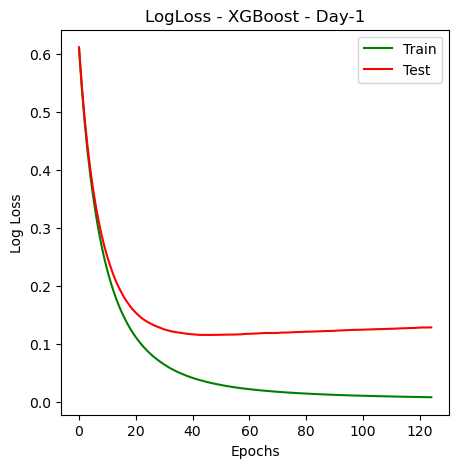

In [33]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(x_axis, results["validation_0"]["logloss"], 'g', label="Train")
ax.plot(x_axis, results["validation_1"]["logloss"], 'r', label="Test")
ax.legend()
plt.ylabel("Log Loss")
plt.xlabel("Epochs")
plt.title("LogLoss - XGBoost - Day-1")
plt.show()


In [34]:
results = clf_3_day.evals_result()
epochs = len(results["validation_0"]["error"])
x_axis = range(0, epochs)

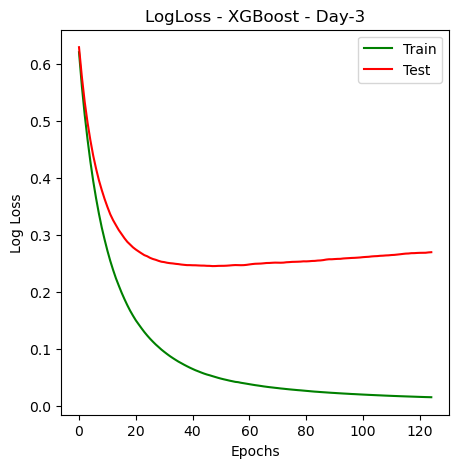

In [35]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(x_axis, results["validation_0"]["logloss"], 'g', label="Train")
ax.plot(x_axis, results["validation_1"]["logloss"], 'r', label="Test")
ax.legend()
plt.ylabel("Log Loss")
plt.xlabel("Epochs")
plt.title("LogLoss - XGBoost - Day-3")
plt.show()

In [36]:
results = clf_5_day.evals_result()
epochs = len(results["validation_0"]["error"])
x_axis = range(0, epochs)

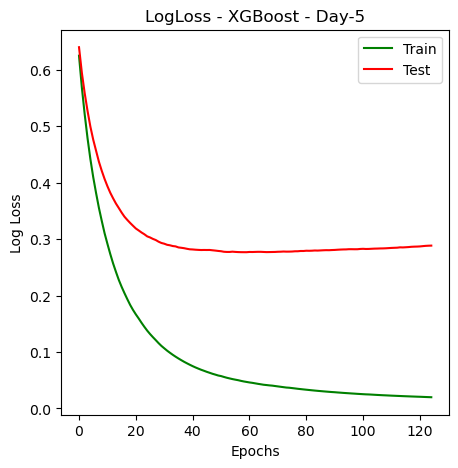

In [37]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(x_axis, results["validation_0"]["logloss"], 'g', label="Train")
ax.plot(x_axis, results["validation_1"]["logloss"], 'r', label="Test")
ax.legend()
plt.ylabel("Log Loss")
plt.xlabel("Epochs")
plt.title("LogLoss - XGBoost - Day-5")
plt.show()

In [38]:
results = clf_7_day.evals_result()
epochs = len(results["validation_0"]["error"])
x_axis = range(0, epochs)

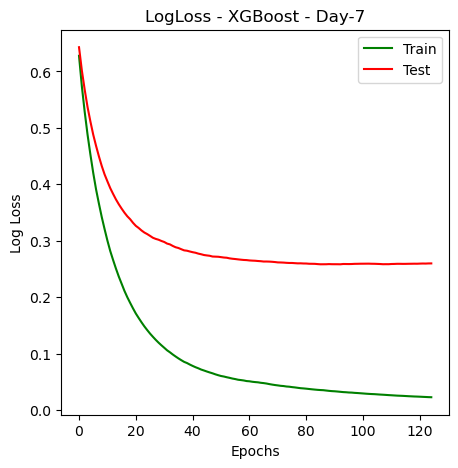

In [39]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(x_axis, results["validation_0"]["logloss"], 'g', label="Train")
ax.plot(x_axis, results["validation_1"]["logloss"], 'r', label="Test")
ax.legend()
plt.ylabel("Log Loss")
plt.xlabel("Epochs")
plt.title("LogLoss - XGBoost - Day-7")
plt.show()

In [40]:
feat_importances = pd.Series(clf_1_day.feature_importances_, index=feature_names)
plt.figure(figsize=(100, 100))
feat_importances.nlargest(50).plot(kind='barh', title = "Feature Importances for 1-Day Prediction", fontsize = 100) # 386 features in total

<AxesSubplot:title={'center':'Feature Importances for 1-Day Prediction'}>

In [41]:
feat_importances = pd.Series(clf_3_day.feature_importances_, index=feature_names)
plt.figure(figsize=(100, 100))
feat_importances.nlargest(50).plot(kind='barh', title = "Feature Importances for 3-Day Prediction", fontsize = 100) #386 features in total

<AxesSubplot:title={'center':'Feature Importances for 3-Day Prediction'}>

In [42]:
feat_importances = pd.Series(clf_5_day.feature_importances_, index=feature_names)
feat_importances.sort_values(ascending= False)
feat_importances_array = feat_importances.index.values.tolist()
print(feat_importances_array[:80])
plt.figure(figsize=(100, 100))
feat_importances.nlargest(50).plot(kind='barh', title = "Feature Importances for 5-Day Prediction", fontsize = 100) #386 features in total

['severaly_error_second', 'error_second', 'unavail_second', 'bbe', 'rxlevmax', 'capacity', 'avail_time', 'temp_max_day1', 'temp_max_day2', 'temp_max_day3', 'temp_max_day4', 'temp_max_day5', 'temp_min_day1', 'temp_min_day2', 'temp_min_day3', 'temp_min_day4', 'temp_min_day5', 'humidity_max_day1', 'humidity_max_day2', 'humidity_max_day3', 'humidity_max_day4', 'humidity_max_day5', 'humidity_min_day1', 'humidity_min_day2', 'humidity_min_day3', 'humidity_min_day4', 'humidity_min_day5', 'wind_dir_day1', 'wind_dir_day2', 'wind_dir_day3', 'wind_dir_day4', 'wind_dir_day5', 'wind_speed_day1', 'wind_speed_day2', 'wind_speed_day3', 'wind_speed_day4', 'wind_speed_day5', 'card_type_cardtype1', 'card_type_cardtype10', 'card_type_cardtype2', 'card_type_cardtype4', 'card_type_cardtype5', 'card_type_cardtype6', 'freq_band_f1', 'freq_band_f2', 'freq_band_f3', 'freq_band_f4', 'freq_band_f5', 'modulation_1024 QAM', 'modulation_1024QAM', 'modulation_128QAM', 'modulation_16QAM', 'modulation_2048QAM', 'modulat

<AxesSubplot:title={'center':'Feature Importances for 5-Day Prediction'}>

In [43]:
feat_importances = pd.Series(clf_7_day.feature_importances_, index=feature_names)
feat_importances.sort_values(ascending= False)
feat_importances_array = feat_importances.index.values.tolist()
print(feat_importances_array[:80])
plt.figure(figsize=(100, 100))
feat_importances.nlargest(50).plot(kind='barh', title = "Feature Importances for 7-Day Prediction", fontsize = 100) #386 features in total

['severaly_error_second', 'error_second', 'unavail_second', 'bbe', 'rxlevmax', 'capacity', 'avail_time', 'temp_max_day1', 'temp_max_day2', 'temp_max_day3', 'temp_max_day4', 'temp_max_day5', 'temp_min_day1', 'temp_min_day2', 'temp_min_day3', 'temp_min_day4', 'temp_min_day5', 'humidity_max_day1', 'humidity_max_day2', 'humidity_max_day3', 'humidity_max_day4', 'humidity_max_day5', 'humidity_min_day1', 'humidity_min_day2', 'humidity_min_day3', 'humidity_min_day4', 'humidity_min_day5', 'wind_dir_day1', 'wind_dir_day2', 'wind_dir_day3', 'wind_dir_day4', 'wind_dir_day5', 'wind_speed_day1', 'wind_speed_day2', 'wind_speed_day3', 'wind_speed_day4', 'wind_speed_day5', 'card_type_cardtype1', 'card_type_cardtype10', 'card_type_cardtype2', 'card_type_cardtype4', 'card_type_cardtype5', 'card_type_cardtype6', 'freq_band_f1', 'freq_band_f2', 'freq_band_f3', 'freq_band_f4', 'freq_band_f5', 'modulation_1024 QAM', 'modulation_1024QAM', 'modulation_128QAM', 'modulation_16QAM', 'modulation_2048QAM', 'modulat

<AxesSubplot:title={'center':'Feature Importances for 7-Day Prediction'}>

In [44]:
#Predicting
train_pred_1_day_xgboost = clf_1_day.predict(train_x)
cv_pred_1_day_xgboost = clf_1_day.predict(cv_x)
test_pred_1_day_xgboost = clf_1_day.predict(test_x)

train_pred_3_day_xgboost = clf_3_day.predict(train_x)
cv_pred_3_day_xgboost = clf_3_day.predict(cv_x)
test_pred_3_day_xgboost = clf_3_day.predict(test_x)

train_pred_5_day_xgboost = clf_5_day.predict(train_x)
cv_pred_5_day_xgboost = clf_5_day.predict(cv_x)
test_pred_5_day_xgboost = clf_5_day.predict(test_x)

train_pred_7_day_xgboost = clf_7_day.predict(train_x)
cv_pred_7_day_xgboost = clf_7_day.predict(cv_x)
test_pred_7_day_xgboost = clf_7_day.predict(test_x)

In [45]:
#pred 1 day

print("*********** SCORE for 1-DAY predict (Training Data) ***********")
print(classification_report(train_pred_1_day_xgboost,train_y_1_day))

print()
print("*********** SCORE for 1-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_1_day_xgboost,cv_y_1_day))


*********** SCORE for 1-DAY predict (Training Data) ***********
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      8154
           1       1.00      1.00      1.00       487

    accuracy                           1.00      8641
   macro avg       1.00      1.00      1.00      8641
weighted avg       1.00      1.00      1.00      8641


*********** SCORE for 1-DAY predict (CV Data) ***********
              precision    recall  f1-score   support

           0       0.99      0.98      0.98      2729
           1       0.57      0.84      0.68       106

    accuracy                           0.97      2835
   macro avg       0.78      0.91      0.83      2835
weighted avg       0.98      0.97      0.97      2835



In [46]:
#pred 3 day

print("*********** SCORE for 3-DAY predict (Training Data) ***********")
print(classification_report(train_pred_3_day_xgboost,train_y_3_day))

print()
print("*********** SCORE for 3-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_3_day_xgboost,cv_y_3_day))


*********** SCORE for 3-DAY predict (Training Data) ***********
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7334
           1       1.00      1.00      1.00      1307

    accuracy                           1.00      8641
   macro avg       1.00      1.00      1.00      8641
weighted avg       1.00      1.00      1.00      8641


*********** SCORE for 3-DAY predict (CV Data) ***********
              precision    recall  f1-score   support

           0       0.98      0.92      0.95      2516
           1       0.58      0.82      0.68       319

    accuracy                           0.91      2835
   macro avg       0.78      0.87      0.81      2835
weighted avg       0.93      0.91      0.92      2835



In [47]:
#pred 5 day

print("*********** SCORE for 5-DAY predict (Training Data) ***********")
print(classification_report(train_pred_5_day_xgboost,train_y_5_day))

print()
print("*********** SCORE for 5-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_5_day_xgboost,cv_y_5_day))


*********** SCORE for 5-DAY predict (Training Data) ***********
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6540
           1       1.00      1.00      1.00      2101

    accuracy                           1.00      8641
   macro avg       1.00      1.00      1.00      8641
weighted avg       1.00      1.00      1.00      8641


*********** SCORE for 5-DAY predict (CV Data) ***********
              precision    recall  f1-score   support

           0       0.95      0.90      0.93      2246
           1       0.69      0.82      0.75       589

    accuracy                           0.89      2835
   macro avg       0.82      0.86      0.84      2835
weighted avg       0.90      0.89      0.89      2835



In [48]:
#pred 7 day

print("*********** SCORE for 7-DAY predict (Training Data) ***********")
print(classification_report(train_pred_7_day_xgboost,train_y_7_day))

print()
print("*********** SCORE for 7-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_7_day_xgboost,cv_y_7_day))


*********** SCORE for 7-DAY predict (Training Data) ***********
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5717
           1       1.00      1.00      1.00      2924

    accuracy                           1.00      8641
   macro avg       1.00      1.00      1.00      8641
weighted avg       1.00      1.00      1.00      8641


*********** SCORE for 7-DAY predict (CV Data) ***********
              precision    recall  f1-score   support

           0       0.93      0.91      0.92      1929
           1       0.82      0.86      0.84       906

    accuracy                           0.89      2835
   macro avg       0.87      0.88      0.88      2835
weighted avg       0.89      0.89      0.89      2835



In [49]:
#Testing

print("*********** SCORE for 1-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_1_day_xgboost,test_y_1_day))

print()
print("*********** SCORE for 3-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_3_day_xgboost,test_y_3_day))

print()
print("*********** SCORE for 5-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_5_day_xgboost,test_y_5_day))

print()
print("*********** SCORE for 7-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_7_day_xgboost,test_y_7_day))

*********** SCORE for 1-DAY predict (Testing Data) ***********
              precision    recall  f1-score   support

           0       0.99      0.98      0.98      2729
           1       0.57      0.84      0.68       106

    accuracy                           0.97      2835
   macro avg       0.78      0.91      0.83      2835
weighted avg       0.98      0.97      0.97      2835


*********** SCORE for 3-DAY predict (Testing Data) ***********
              precision    recall  f1-score   support

           0       0.98      0.92      0.95      2516
           1       0.58      0.82      0.68       319

    accuracy                           0.91      2835
   macro avg       0.78      0.87      0.81      2835
weighted avg       0.93      0.91      0.92      2835


*********** SCORE for 5-DAY predict (Testing Data) ***********
              precision    recall  f1-score   support

           0       0.95      0.90      0.93      2246
           1       0.69      0.82      0.75   

### LSTM

In [55]:
# Find Optimal Parameters
def build_lstm(unit):
    # creating the layers of the NN
    ann = tf.keras.models.Sequential()
    #for i in range(nb_layers_lstm):
    ann.add(tf.keras.layers.LSTM(units=unit, activation='sigmoid'))
    #for j in range(nb_layers_dense):
    #ann.add(tf.keras.layers.Dense(units=unit, activation='sigmoid'))
    ann.add(tf.keras.layers.Dense(units=2, activation='relu'))
    ann.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
    return ann


params={'batch_size':[100, 20, 50, 25, 32], 
        'nb_epoch':[200, 100, 300, 400, 500],
        'unit':[5,6, 10, 11, 12, 15],}

#activation, learning rate, batch size, number of layers 
#optimizer


model=KerasClassifier(build_fn=build_lstm)

gs1=GridSearchCV(estimator=model, param_grid=params, scoring = "accuracy", cv=10)
# now fit the dataset to the GridSearchCV object. 
gs1 = gs1.fit(train_x_dim, train_y_1_day)


gs3=GridSearchCV(estimator=model, param_grid=params, scoring = "accuracy", cv=10)
# now fit the dataset to the GridSearchCV object. 
gs3 = gs3.fit(train_x_dim, train_y_3_day)


gs5=GridSearchCV(estimator=model, param_grid=params, scoring = "accuracy", cv=10)
# now fit the dataset to the GridSearchCV object. 
gs5 = gs5.fit(train_x_dim, train_y_5_day)

gs7=GridSearchCV(estimator=model, param_grid=params, scoring = "accuracy", cv=10)
# now fit the dataset to the GridSearchCV object. 
gs7 = gs7.fit(train_x_dim, train_y_7_day)


C:\Users\gueyed\AppData\Local\Temp\1\ipykernel_12472\1600523325.py:21: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model=KerasClassifier(build_fn=build_lstm)


27/27 [==============================] - 0s 1ms/step


27/27 [==============================] - 0s 2ms/step


27/27 [==============================] - 0s 1ms/step


27/27 [==============================] - 0s 2ms/step


27/27 [==============================] - 0s 1ms/step


389/389 [==============================] - 2s 2ms/step - loss: 0.8686 - accuracy: 0.9352


27/27 [==============================] - 0s 1ms/step


389/389 [==============================] - 2s 2ms/step - loss: 0.8402 - accuracy: 0.9441


27/27 [==============================] - 0s 1ms/step


389/389 [==============================] - 2s 2ms/step - loss: 0.8838 - accuracy: 0.9423


27/27 [==============================] - 0s 1ms/step


156/156 [==============================] - 1s 2ms/step - loss: 0.8033 - accuracy: 0.9180


27/27 [==============================] - 0s 1ms/step


156/156 [==============================] - 1s 2ms/step - loss: 0.7804 - accuracy: 0.9427


27/27 [==============================] - 0s 1ms/step


312/312 [==============================] - 2s 2ms/step - loss: 0.8511 - accuracy: 0.9144


27/27 [==============================] - 0s 1ms/step


312/312 [==============================] - 2s 2ms/step - loss: 0.7692 - accuracy: 0.8143


27/27 [==============================] - 0s 1ms/step


312/312 [==============================] - 2s 2ms/step - loss: 0.5630 - accuracy: 0.0964


27/27 [==============================] - 0s 1ms/step


244/244 [==============================] - 2s 2ms/step - loss: 0.8207 - accuracy: 0.9427


27/27 [==============================] - 0s 1ms/step


244/244 [==============================] - 2s 2ms/step - loss: 0.8541 - accuracy: 0.9439


27/27 [==============================] - 0s 1ms/step


244/244 [==============================] - 2s 2ms/step - loss: 0.8784 - accuracy: 0.9258


27/27 [==============================] - 0s 1ms/step


27/27 [==============================] - 0s 1ms/step


28/28 [==============================] - 0s 1ms/step


27/27 [==============================] - 0s 1ms/step


27/27 [==============================] - 0s 1ms/step


389/389 [==============================] - 2s 2ms/step - loss: 0.4766 - accuracy: 0.6924


27/27 [==============================] - 0s 1ms/step


389/389 [==============================] - 2s 2ms/step - loss: 0.6212 - accuracy: 0.3908


27/27 [==============================] - 0s 1ms/step


389/389 [==============================] - 2s 2ms/step - loss: 0.8335 - accuracy: 0.8060


27/27 [==============================] - 0s 1ms/step


156/156 [==============================] - 2s 2ms/step - loss: 2.3324 - accuracy: 0.8467


27/27 [==============================] - 0s 1ms/step


156/156 [==============================] - 1s 2ms/step - loss: 1.5103 - accuracy: 0.7131


27/27 [==============================] - 0s 1ms/step


312/312 [==============================] - 2s 2ms/step - loss: 2.3389 - accuracy: 0.8480


27/27 [==============================] - 0s 1ms/step


312/312 [==============================] - 2s 2ms/step - loss: 0.5124 - accuracy: 0.7000


27/27 [==============================] - 0s 1ms/step


312/312 [==============================] - 2s 2ms/step - loss: 2.3404 - accuracy: 0.8483


27/27 [==============================] - 0s 1ms/step


244/244 [==============================] - 2s 2ms/step - loss: 0.5002 - accuracy: 0.2339


27/27 [==============================] - 0s 1ms/step


244/244 [==============================] - 2s 2ms/step - loss: 1.4307 - accuracy: 0.3353


27/27 [==============================] - 0s 1ms/step


244/244 [==============================] - 2s 3ms/step - loss: 1.5482 - accuracy: 0.2615


27/27 [==============================] - 0s 1ms/step


27/27 [==============================] - 0s 1ms/step


27/27 [==============================] - 0s 1ms/step


27/27 [==============================] - 0s 1ms/step


27/27 [==============================] - 0s 1ms/step


389/389 [==============================] - 2s 2ms/step - loss: 2.3716 - accuracy: 0.7566


27/27 [==============================] - 0s 1ms/step


389/389 [==============================] - 2s 2ms/step - loss: 0.6218 - accuracy: 0.7162


27/27 [==============================] - 0s 1ms/step


389/389 [==============================] - 2s 2ms/step - loss: 1.1951 - accuracy: 0.6339


27/27 [==============================] - 0s 1ms/step


156/156 [==============================] - 1s 2ms/step - loss: 2.1553 - accuracy: 0.2495


27/27 [==============================] - 0s 1ms/step


156/156 [==============================] - 2s 3ms/step - loss: 0.8812 - accuracy: 0.5212


27/27 [==============================] - 0s 1ms/step


312/312 [==============================] - 2s 2ms/step - loss: 0.9246 - accuracy: 0.4369


27/27 [==============================] - 0s 1ms/step


312/312 [==============================] - 2s 2ms/step - loss: 0.7295 - accuracy: 0.2480


27/27 [==============================] - 0s 1ms/step


312/312 [==============================] - 2s 2ms/step - loss: 2.1493 - accuracy: 0.2426


27/27 [==============================] - 0s 1ms/step


244/244 [==============================] - 2s 2ms/step - loss: 2.1610 - accuracy: 0.7566


27/27 [==============================] - 0s 1ms/step


244/244 [==============================] - 2s 3ms/step - loss: 0.5955 - accuracy: 0.4440


27/27 [==============================] - 0s 2ms/step


244/244 [==============================] - 2s 3ms/step - loss: 2.5270 - accuracy: 0.3717


27/27 [==============================] - 0s 1ms/step


27/27 [==============================] - 0s 2ms/step


27/27 [==============================] - 0s 2ms/step


27/27 [==============================] - 0s 1ms/step


28/28 [==============================] - 0s 2ms/step


389/389 [==============================] - 2s 2ms/step - loss: 0.6606 - accuracy: 0.5811


27/27 [==============================] - 0s 1ms/step


389/389 [==============================] - 2s 2ms/step - loss: 0.8319 - accuracy: 0.3690


28/28 [==============================] - 0s 2ms/step


389/389 [==============================] - 2s 2ms/step - loss: 0.8450 - accuracy: 0.4561


27/27 [==============================] - 0s 1ms/step


156/156 [==============================] - 1s 3ms/step - loss: 1.5830 - accuracy: 0.4430


28/28 [==============================] - 0s 1ms/step


156/156 [==============================] - 1s 2ms/step - loss: 2.9717 - accuracy: 0.3451


27/27 [==============================] - 0s 1ms/step


312/312 [==============================] - 2s 2ms/step - loss: 0.7062 - accuracy: 0.5951


28/28 [==============================] - 0s 1ms/step


312/312 [==============================] - 2s 2ms/step - loss: 1.2714 - accuracy: 0.6254


27/27 [==============================] - 0s 1ms/step


312/312 [==============================] - 2s 2ms/step - loss: 2.0057 - accuracy: 0.6119


28/28 [==============================] - 0s 1ms/step


244/244 [==============================] - 2s 3ms/step - loss: 1.8002 - accuracy: 0.6011


27/27 [==============================] - 0s 2ms/step


244/244 [==============================] - 2s 3ms/step - loss: 0.7192 - accuracy: 0.5578


28/28 [==============================] - 0s 2ms/step


244/244 [==============================] - 2s 3ms/step - loss: 0.6971 - accuracy: 0.4464


433/433 [==============================] - 2s 2ms/step - loss: 2.9231 - accuracy: 0.6622


In [56]:
best_params=gs1.best_params_
accuracy=gs1.best_score_
print(best_params)
print(accuracy)

{'batch_size': 20, 'nb_epoch': 500, 'unit': 11}
0.9417890976236352


In [57]:
best_params=gs3.best_params_
accuracy=gs3.best_score_
print(best_params)
print(accuracy)

{'batch_size': 50, 'nb_epoch': 200, 'unit': 11}
0.6873133429672447


In [58]:
best_params=gs5.best_params_
accuracy=gs5.best_score_
print(best_params)
print(accuracy)

{'batch_size': 32, 'nb_epoch': 200, 'unit': 5}
0.6605823164204668


In [59]:
best_params=gs7.best_params_
accuracy=gs7.best_score_
print(best_params)
print(accuracy)

{'batch_size': 20, 'nb_epoch': 300, 'unit': 5}
0.6207580014986084


In [54]:
#Reshaping

cv_x_dim = np.reshape(cv_x,(cv_x.shape[0],1, train_x.shape[1]))
test_x_dim = np.reshape(test_x,(test_x.shape[0],1, test_x.shape[1]))

In [50]:
# Building the model

print(train_x.shape)
train_x_dim = np.reshape(train_x,(train_x.shape[0],1, train_x.shape[1]))
print(train_x_dim.shape)

model_1_day = Sequential(
    [                
        #tf.keras.Input(shape=train_x.shape),  
        layers.LSTM(6, input_shape = (1,389), activation = 'sigmoid', name = 'layer1'),
        layers.Dense(2, activation = 'linear', name = 'layer2'),
        #layers.Dense(2, activation = 'linear', name = 'layer3')

    ], name = "LSTMmodelDay1" 
)

print(model_1_day.summary())

(8641, 389)
(8641, 1, 389)
Model: "LSTMmodelDay1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (LSTM)               (None, 6)                 9504      
                                                                 
 layer2 (Dense)              (None, 2)                 14        
                                                                 
Total params: 9,518
Trainable params: 9,518
Non-trainable params: 0
_________________________________________________________________
None


In [51]:
# Building the model

model_3_day = Sequential(
    [                
        #tf.keras.Input(shape=train_x.shape),  
        layers.LSTM(6, input_shape = (1,389), activation = 'sigmoid', name = 'layer1'),
        layers.Dense(2, activation = 'linear', name = 'layer2'),
        #layers.Dense(2, activation = 'linear', name = 'layer3')

    ], name = "LSTMmodelDay3" 
)

print(model_3_day.summary())

Model: "LSTMmodelDay3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (LSTM)               (None, 6)                 9504      
                                                                 
 layer2 (Dense)              (None, 2)                 14        
                                                                 
Total params: 9,518
Trainable params: 9,518
Non-trainable params: 0
_________________________________________________________________
None


In [52]:
# Building the model

model_5_day = Sequential(
    [                
        #tf.keras.Input(shape=train_x.shape),  
        layers.LSTM(6, input_shape = (1,389), activation = 'sigmoid', name = 'layer1'),
        layers.Dense(2, activation = 'linear', name = 'layer2'),
        #layers.Dense(2, activation = 'linear', name = 'layer3')

    ], name = "LSTMmodelDay5" 
)

print(model_5_day.summary())

Model: "LSTMmodelDay5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (LSTM)               (None, 6)                 9504      
                                                                 
 layer2 (Dense)              (None, 2)                 14        
                                                                 
Total params: 9,518
Trainable params: 9,518
Non-trainable params: 0
_________________________________________________________________
None


In [53]:
# Building the model

model_7_day = Sequential(
    [                
        #tf.keras.Input(shape=train_x.shape),  
        layers.LSTM(6, input_shape = (1,389), activation = 'sigmoid', name = 'layer1'),
        layers.Dense(2, activation = 'linear', name = 'layer2'),
        #layers.Dense(2, activation = 'linear', name = 'layer3')

    ], name = "LSTMmodelDay7" 
)

print(model_7_day.summary())

Model: "LSTMmodelDay7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (LSTM)               (None, 6)                 9504      
                                                                 
 layer2 (Dense)              (None, 2)                 14        
                                                                 
Total params: 9,518
Trainable params: 9,518
Non-trainable params: 0
_________________________________________________________________
None


In [60]:
# Training 

model_1_day.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[keras.metrics.SparseCategoricalAccuracy()]
)


history = model_1_day.fit(
    train_x_dim, train_y_1_day,
    validation_data = (test_x_dim,  test_y_1_day),
    epochs=200
)
    

Epoch 1/200
271/271 [==============================] - 3s 8ms/step - loss: 0.2329 - sparse_categorical_accuracy: 0.9436 - val_loss: 0.2142 - val_sparse_categorical_accuracy: 0.9446
Epoch 2/200
271/271 [==============================] - 1s 3ms/step - loss: 0.2165 - sparse_categorical_accuracy: 0.9436 - val_loss: 0.2134 - val_sparse_categorical_accuracy: 0.9446
Epoch 3/200
271/271 [==============================] - 1s 3ms/step - loss: 0.2162 - sparse_categorical_accuracy: 0.9436 - val_loss: 0.2129 - val_sparse_categorical_accuracy: 0.9446
Epoch 4/200
271/271 [==============================] - 1s 3ms/step - loss: 0.2157 - sparse_categorical_accuracy: 0.9436 - val_loss: 0.2125 - val_sparse_categorical_accuracy: 0.9446
Epoch 5/200
271/271 [==============================] - 1s 3ms/step - loss: 0.2160 - sparse_categorical_accuracy: 0.9436 - val_loss: 0.2181 - val_sparse_categorical_accuracy: 0.9446
Epoch 6/200
271/271 [==============================] - 1s 3ms/step - loss: 0.2178 - sparse_cate

271/271 [==============================] - 1s 3ms/step - loss: 0.1899 - sparse_categorical_accuracy: 0.9436 - val_loss: 0.1884 - val_sparse_categorical_accuracy: 0.9446
Epoch 47/200
271/271 [==============================] - 1s 3ms/step - loss: 0.1878 - sparse_categorical_accuracy: 0.9436 - val_loss: 0.1852 - val_sparse_categorical_accuracy: 0.9446
Epoch 48/200
271/271 [==============================] - 1s 3ms/step - loss: 0.1865 - sparse_categorical_accuracy: 0.9436 - val_loss: 0.1889 - val_sparse_categorical_accuracy: 0.9446
Epoch 49/200
271/271 [==============================] - 1s 3ms/step - loss: 0.1884 - sparse_categorical_accuracy: 0.9436 - val_loss: 0.1890 - val_sparse_categorical_accuracy: 0.9446
Epoch 50/200
271/271 [==============================] - 1s 3ms/step - loss: 0.1848 - sparse_categorical_accuracy: 0.9436 - val_loss: 0.1823 - val_sparse_categorical_accuracy: 0.9446
Epoch 51/200
271/271 [==============================] - 1s 2ms/step - loss: 0.1845 - sparse_categorical

271/271 [==============================] - 1s 2ms/step - loss: 0.1625 - sparse_categorical_accuracy: 0.9441 - val_loss: 0.1645 - val_sparse_categorical_accuracy: 0.9436
Epoch 92/200
271/271 [==============================] - 1s 2ms/step - loss: 0.1613 - sparse_categorical_accuracy: 0.9439 - val_loss: 0.1659 - val_sparse_categorical_accuracy: 0.9432
Epoch 93/200
271/271 [==============================] - 1s 3ms/step - loss: 0.1604 - sparse_categorical_accuracy: 0.9439 - val_loss: 0.1606 - val_sparse_categorical_accuracy: 0.9436
Epoch 94/200
271/271 [==============================] - 1s 3ms/step - loss: 0.1623 - sparse_categorical_accuracy: 0.9439 - val_loss: 0.1659 - val_sparse_categorical_accuracy: 0.9436
Epoch 95/200
271/271 [==============================] - 1s 2ms/step - loss: 0.1637 - sparse_categorical_accuracy: 0.9436 - val_loss: 0.1582 - val_sparse_categorical_accuracy: 0.9436
Epoch 96/200
271/271 [==============================] - 1s 3ms/step - loss: 0.1796 - sparse_categorical

Epoch 136/200
271/271 [==============================] - 1s 2ms/step - loss: 0.1816 - sparse_categorical_accuracy: 0.9435 - val_loss: 0.1783 - val_sparse_categorical_accuracy: 0.9439
Epoch 137/200
271/271 [==============================] - 1s 3ms/step - loss: 0.1822 - sparse_categorical_accuracy: 0.9439 - val_loss: 0.1815 - val_sparse_categorical_accuracy: 0.9443
Epoch 138/200
271/271 [==============================] - 1s 2ms/step - loss: 0.1798 - sparse_categorical_accuracy: 0.9441 - val_loss: 0.1774 - val_sparse_categorical_accuracy: 0.9439
Epoch 139/200
271/271 [==============================] - 1s 3ms/step - loss: 0.1807 - sparse_categorical_accuracy: 0.9439 - val_loss: 0.1787 - val_sparse_categorical_accuracy: 0.9439
Epoch 140/200
271/271 [==============================] - 1s 2ms/step - loss: 0.1790 - sparse_categorical_accuracy: 0.9439 - val_loss: 0.1780 - val_sparse_categorical_accuracy: 0.9436
Epoch 141/200
271/271 [==============================] - 1s 2ms/step - loss: 0.1773 -

Epoch 181/200
271/271 [==============================] - 1s 2ms/step - loss: 0.1631 - sparse_categorical_accuracy: 0.9441 - val_loss: 0.1704 - val_sparse_categorical_accuracy: 0.9432
Epoch 182/200
271/271 [==============================] - 1s 2ms/step - loss: 0.1640 - sparse_categorical_accuracy: 0.9441 - val_loss: 0.1680 - val_sparse_categorical_accuracy: 0.9439
Epoch 183/200
271/271 [==============================] - 1s 3ms/step - loss: 0.1666 - sparse_categorical_accuracy: 0.9442 - val_loss: 0.1707 - val_sparse_categorical_accuracy: 0.9436
Epoch 184/200
271/271 [==============================] - 1s 2ms/step - loss: 0.1633 - sparse_categorical_accuracy: 0.9439 - val_loss: 0.1637 - val_sparse_categorical_accuracy: 0.9450
Epoch 185/200
271/271 [==============================] - 1s 2ms/step - loss: 0.1615 - sparse_categorical_accuracy: 0.9439 - val_loss: 0.1649 - val_sparse_categorical_accuracy: 0.9446
Epoch 186/200
271/271 [==============================] - 1s 2ms/step - loss: 0.1646 -

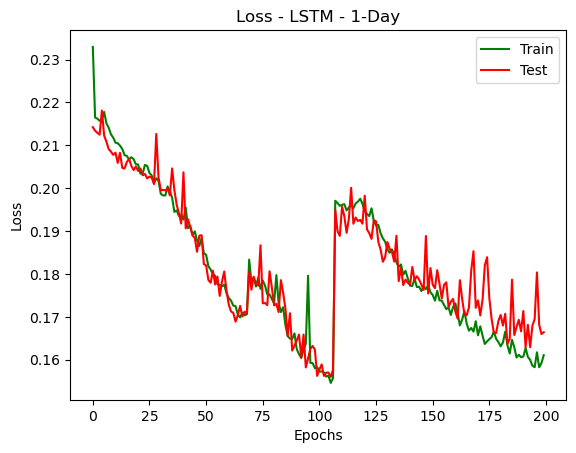

In [61]:
plt.plot(history.epoch, history.history["loss"], 'g', label = "Train")
plt.plot(history.epoch, history.history['val_loss'], 'r', label = "Test")
plt.title('Loss - LSTM - 1-Day')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [62]:
# Training 

model_3_day.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[keras.metrics.SparseCategoricalAccuracy()]
)

history = model_3_day.fit(
    train_x_dim, train_y_3_day,
    validation_data = (test_x_dim,  test_y_3_day),
    epochs=200
)

Epoch 1/200
271/271 [==============================] - 2s 3ms/step - loss: 0.4644 - sparse_categorical_accuracy: 0.8442 - val_loss: 0.4369 - val_sparse_categorical_accuracy: 0.8402
Epoch 2/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4214 - sparse_categorical_accuracy: 0.8487 - val_loss: 0.4336 - val_sparse_categorical_accuracy: 0.8402
Epoch 3/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4165 - sparse_categorical_accuracy: 0.8487 - val_loss: 0.4289 - val_sparse_categorical_accuracy: 0.8402
Epoch 4/200
271/271 [==============================] - 1s 2ms/step - loss: 0.4123 - sparse_categorical_accuracy: 0.8487 - val_loss: 0.4276 - val_sparse_categorical_accuracy: 0.8402
Epoch 5/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4086 - sparse_categorical_accuracy: 0.8487 - val_loss: 0.4277 - val_sparse_categorical_accuracy: 0.8402
Epoch 6/200
271/271 [==============================] - 1s 2ms/step - loss: 0.4074 - sparse_cate

271/271 [==============================] - 1s 3ms/step - loss: 0.3649 - sparse_categorical_accuracy: 0.8475 - val_loss: 0.3887 - val_sparse_categorical_accuracy: 0.8392
Epoch 47/200
271/271 [==============================] - 1s 3ms/step - loss: 0.3626 - sparse_categorical_accuracy: 0.8467 - val_loss: 0.3979 - val_sparse_categorical_accuracy: 0.8377
Epoch 48/200
271/271 [==============================] - 1s 3ms/step - loss: 0.3615 - sparse_categorical_accuracy: 0.8482 - val_loss: 0.3836 - val_sparse_categorical_accuracy: 0.8413
Epoch 49/200
271/271 [==============================] - 1s 3ms/step - loss: 0.3602 - sparse_categorical_accuracy: 0.8478 - val_loss: 0.3891 - val_sparse_categorical_accuracy: 0.8395
Epoch 50/200
271/271 [==============================] - 1s 3ms/step - loss: 0.3625 - sparse_categorical_accuracy: 0.8491 - val_loss: 0.3810 - val_sparse_categorical_accuracy: 0.8420
Epoch 51/200
271/271 [==============================] - 1s 3ms/step - loss: 0.3655 - sparse_categorical

271/271 [==============================] - 1s 3ms/step - loss: 0.3180 - sparse_categorical_accuracy: 0.8529 - val_loss: 0.3502 - val_sparse_categorical_accuracy: 0.8434
Epoch 92/200
271/271 [==============================] - 1s 3ms/step - loss: 0.3179 - sparse_categorical_accuracy: 0.8564 - val_loss: 0.3475 - val_sparse_categorical_accuracy: 0.8628
Epoch 93/200
271/271 [==============================] - 1s 3ms/step - loss: 0.3149 - sparse_categorical_accuracy: 0.8582 - val_loss: 0.3554 - val_sparse_categorical_accuracy: 0.8607
Epoch 94/200
271/271 [==============================] - 1s 3ms/step - loss: 0.3133 - sparse_categorical_accuracy: 0.8711 - val_loss: 0.3455 - val_sparse_categorical_accuracy: 0.8476
Epoch 95/200
271/271 [==============================] - 1s 2ms/step - loss: 0.3163 - sparse_categorical_accuracy: 0.8560 - val_loss: 0.3619 - val_sparse_categorical_accuracy: 0.8427
Epoch 96/200
271/271 [==============================] - 1s 3ms/step - loss: 0.3132 - sparse_categorical

Epoch 136/200
271/271 [==============================] - 1s 3ms/step - loss: 0.2961 - sparse_categorical_accuracy: 0.8801 - val_loss: 0.3331 - val_sparse_categorical_accuracy: 0.8677
Epoch 137/200
271/271 [==============================] - 1s 3ms/step - loss: 0.2990 - sparse_categorical_accuracy: 0.8792 - val_loss: 0.3377 - val_sparse_categorical_accuracy: 0.8628
Epoch 138/200
271/271 [==============================] - 1s 3ms/step - loss: 0.2975 - sparse_categorical_accuracy: 0.8780 - val_loss: 0.3375 - val_sparse_categorical_accuracy: 0.8667
Epoch 139/200
271/271 [==============================] - 1s 2ms/step - loss: 0.2996 - sparse_categorical_accuracy: 0.8771 - val_loss: 0.3396 - val_sparse_categorical_accuracy: 0.8624
Epoch 140/200
271/271 [==============================] - 1s 3ms/step - loss: 0.2935 - sparse_categorical_accuracy: 0.8807 - val_loss: 0.3392 - val_sparse_categorical_accuracy: 0.8646
Epoch 141/200
271/271 [==============================] - 1s 3ms/step - loss: 0.2973 -

Epoch 181/200
271/271 [==============================] - 1s 3ms/step - loss: 0.3059 - sparse_categorical_accuracy: 0.8707 - val_loss: 0.3692 - val_sparse_categorical_accuracy: 0.8208
Epoch 182/200
271/271 [==============================] - 1s 3ms/step - loss: 0.3101 - sparse_categorical_accuracy: 0.8661 - val_loss: 0.3574 - val_sparse_categorical_accuracy: 0.8568
Epoch 183/200
271/271 [==============================] - 1s 3ms/step - loss: 0.3075 - sparse_categorical_accuracy: 0.8720 - val_loss: 0.3564 - val_sparse_categorical_accuracy: 0.8564
Epoch 184/200
271/271 [==============================] - 1s 3ms/step - loss: 0.3036 - sparse_categorical_accuracy: 0.8697 - val_loss: 0.3549 - val_sparse_categorical_accuracy: 0.8480
Epoch 185/200
271/271 [==============================] - 1s 3ms/step - loss: 0.3078 - sparse_categorical_accuracy: 0.8693 - val_loss: 0.3501 - val_sparse_categorical_accuracy: 0.8578
Epoch 186/200
271/271 [==============================] - 1s 3ms/step - loss: 0.3037 -

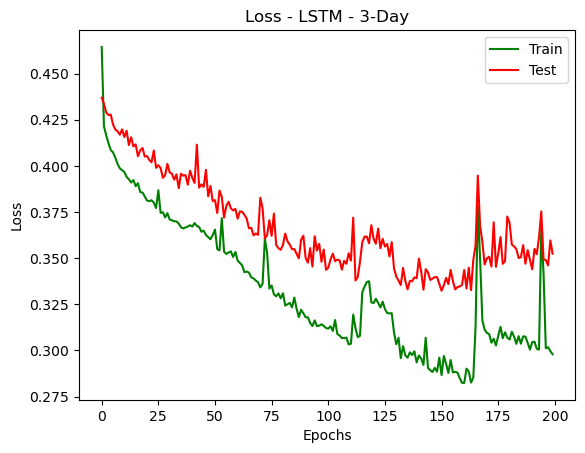

In [63]:
plt.plot(history.epoch, history.history["loss"], 'g', label = "Train")
plt.plot(history.epoch, history.history['val_loss'], 'r', label = "Test")
plt.title('Loss - LSTM - 3-Day')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [64]:
# Training 

model_5_day.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[keras.metrics.SparseCategoricalAccuracy()]
)

history = model_5_day.fit(
    train_x_dim, train_y_5_day,
    validation_data = (test_x_dim,  test_y_5_day),
    epochs=200
)

Epoch 1/200
271/271 [==============================] - 2s 4ms/step - loss: 0.6006 - sparse_categorical_accuracy: 0.6895 - val_loss: 0.5593 - val_sparse_categorical_accuracy: 0.7534
Epoch 2/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5544 - sparse_categorical_accuracy: 0.7569 - val_loss: 0.5574 - val_sparse_categorical_accuracy: 0.7534
Epoch 3/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5521 - sparse_categorical_accuracy: 0.7569 - val_loss: 0.5485 - val_sparse_categorical_accuracy: 0.7534
Epoch 4/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5414 - sparse_categorical_accuracy: 0.7569 - val_loss: 0.5461 - val_sparse_categorical_accuracy: 0.7534
Epoch 5/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5516 - sparse_categorical_accuracy: 0.7569 - val_loss: 0.5480 - val_sparse_categorical_accuracy: 0.7534
Epoch 6/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5338 - sparse_cate

271/271 [==============================] - 1s 3ms/step - loss: 0.4473 - sparse_categorical_accuracy: 0.7994 - val_loss: 0.5038 - val_sparse_categorical_accuracy: 0.7697
Epoch 47/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4590 - sparse_categorical_accuracy: 0.7896 - val_loss: 0.4691 - val_sparse_categorical_accuracy: 0.7841
Epoch 48/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4469 - sparse_categorical_accuracy: 0.7968 - val_loss: 0.4758 - val_sparse_categorical_accuracy: 0.7619
Epoch 49/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4422 - sparse_categorical_accuracy: 0.8038 - val_loss: 0.4489 - val_sparse_categorical_accuracy: 0.7989
Epoch 50/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4379 - sparse_categorical_accuracy: 0.8063 - val_loss: 0.4814 - val_sparse_categorical_accuracy: 0.7845
Epoch 51/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4362 - sparse_categorical

271/271 [==============================] - 1s 3ms/step - loss: 0.4056 - sparse_categorical_accuracy: 0.8152 - val_loss: 0.4446 - val_sparse_categorical_accuracy: 0.7947
Epoch 92/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4009 - sparse_categorical_accuracy: 0.8185 - val_loss: 0.4264 - val_sparse_categorical_accuracy: 0.8095
Epoch 93/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4050 - sparse_categorical_accuracy: 0.8152 - val_loss: 0.4334 - val_sparse_categorical_accuracy: 0.8063
Epoch 94/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4062 - sparse_categorical_accuracy: 0.8147 - val_loss: 0.4244 - val_sparse_categorical_accuracy: 0.8060
Epoch 95/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4016 - sparse_categorical_accuracy: 0.8197 - val_loss: 0.5161 - val_sparse_categorical_accuracy: 0.7496
Epoch 96/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4921 - sparse_categorical

Epoch 136/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4443 - sparse_categorical_accuracy: 0.8170 - val_loss: 0.4454 - val_sparse_categorical_accuracy: 0.8173
Epoch 137/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4442 - sparse_categorical_accuracy: 0.8159 - val_loss: 0.4635 - val_sparse_categorical_accuracy: 0.8085
Epoch 138/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4488 - sparse_categorical_accuracy: 0.8130 - val_loss: 0.4689 - val_sparse_categorical_accuracy: 0.8060
Epoch 139/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4410 - sparse_categorical_accuracy: 0.8210 - val_loss: 0.4450 - val_sparse_categorical_accuracy: 0.8173
Epoch 140/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4382 - sparse_categorical_accuracy: 0.8206 - val_loss: 0.4477 - val_sparse_categorical_accuracy: 0.8176
Epoch 141/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4427 -

Epoch 181/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4279 - sparse_categorical_accuracy: 0.8210 - val_loss: 0.4338 - val_sparse_categorical_accuracy: 0.8131
Epoch 182/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4283 - sparse_categorical_accuracy: 0.8183 - val_loss: 0.4402 - val_sparse_categorical_accuracy: 0.8176
Epoch 183/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4281 - sparse_categorical_accuracy: 0.8161 - val_loss: 0.4726 - val_sparse_categorical_accuracy: 0.7538
Epoch 184/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4289 - sparse_categorical_accuracy: 0.8148 - val_loss: 0.4368 - val_sparse_categorical_accuracy: 0.8162
Epoch 185/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4292 - sparse_categorical_accuracy: 0.8138 - val_loss: 0.4323 - val_sparse_categorical_accuracy: 0.8145
Epoch 186/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4259 -

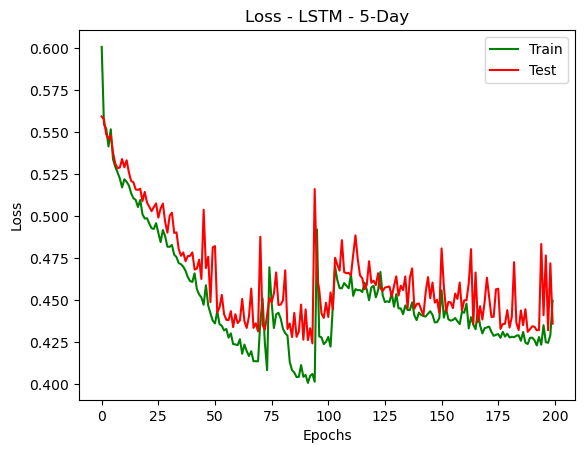

In [65]:
plt.plot(history.epoch, history.history["loss"], 'g', label = "Train")
plt.plot(history.epoch, history.history['val_loss'], 'r', label = "Test")
plt.title('Loss - LSTM - 5-Day')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [66]:
# Training 

model_7_day.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[keras.metrics.SparseCategoricalAccuracy()]
)

history = model_7_day.fit(
    train_x_dim, train_y_7_day,
    validation_data = (test_x_dim,  test_y_7_day),
    epochs=200
)

Epoch 1/200
271/271 [==============================] - 2s 4ms/step - loss: 0.6188 - sparse_categorical_accuracy: 0.6667 - val_loss: 0.6071 - val_sparse_categorical_accuracy: 0.6705
Epoch 2/200
271/271 [==============================] - 1s 3ms/step - loss: 0.6011 - sparse_categorical_accuracy: 0.6689 - val_loss: 0.5998 - val_sparse_categorical_accuracy: 0.6741
Epoch 3/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5956 - sparse_categorical_accuracy: 0.6756 - val_loss: 0.5898 - val_sparse_categorical_accuracy: 0.6765
Epoch 4/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5882 - sparse_categorical_accuracy: 0.6787 - val_loss: 0.5844 - val_sparse_categorical_accuracy: 0.7143
Epoch 5/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5836 - sparse_categorical_accuracy: 0.6931 - val_loss: 0.5799 - val_sparse_categorical_accuracy: 0.7153
Epoch 6/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5817 - sparse_cate

271/271 [==============================] - 1s 3ms/step - loss: 0.6191 - sparse_categorical_accuracy: 0.6694 - val_loss: 0.5874 - val_sparse_categorical_accuracy: 0.6758
Epoch 47/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5540 - sparse_categorical_accuracy: 0.7224 - val_loss: 0.5509 - val_sparse_categorical_accuracy: 0.7453
Epoch 48/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5462 - sparse_categorical_accuracy: 0.7321 - val_loss: 0.5315 - val_sparse_categorical_accuracy: 0.7354
Epoch 49/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5314 - sparse_categorical_accuracy: 0.7442 - val_loss: 0.5382 - val_sparse_categorical_accuracy: 0.7347
Epoch 50/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5316 - sparse_categorical_accuracy: 0.7457 - val_loss: 0.5412 - val_sparse_categorical_accuracy: 0.7344
Epoch 51/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5237 - sparse_categorical

271/271 [==============================] - 1s 3ms/step - loss: 0.4555 - sparse_categorical_accuracy: 0.7974 - val_loss: 0.4565 - val_sparse_categorical_accuracy: 0.7940
Epoch 92/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4545 - sparse_categorical_accuracy: 0.7956 - val_loss: 0.4661 - val_sparse_categorical_accuracy: 0.7954
Epoch 93/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4611 - sparse_categorical_accuracy: 0.7930 - val_loss: 0.5127 - val_sparse_categorical_accuracy: 0.7690
Epoch 94/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4566 - sparse_categorical_accuracy: 0.7959 - val_loss: 0.4557 - val_sparse_categorical_accuracy: 0.7986
Epoch 95/200
271/271 [==============================] - 1s 2ms/step - loss: 0.4508 - sparse_categorical_accuracy: 0.8020 - val_loss: 0.5289 - val_sparse_categorical_accuracy: 0.7584
Epoch 96/200
271/271 [==============================] - 1s 2ms/step - loss: 0.4554 - sparse_categorical

Epoch 136/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4542 - sparse_categorical_accuracy: 0.7893 - val_loss: 0.4622 - val_sparse_categorical_accuracy: 0.7933
Epoch 137/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4341 - sparse_categorical_accuracy: 0.8071 - val_loss: 0.5450 - val_sparse_categorical_accuracy: 0.6924
Epoch 138/200
271/271 [==============================] - 1s 3ms/step - loss: 0.6399 - sparse_categorical_accuracy: 0.6448 - val_loss: 0.5893 - val_sparse_categorical_accuracy: 0.6730
Epoch 139/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5687 - sparse_categorical_accuracy: 0.7037 - val_loss: 0.5613 - val_sparse_categorical_accuracy: 0.7157
Epoch 140/200
271/271 [==============================] - 1s 3ms/step - loss: 0.5583 - sparse_categorical_accuracy: 0.7099 - val_loss: 0.5613 - val_sparse_categorical_accuracy: 0.7153
Epoch 141/200
271/271 [==============================] - 1s 2ms/step - loss: 0.5550 -

Epoch 181/200
271/271 [==============================] - 1s 2ms/step - loss: 0.4654 - sparse_categorical_accuracy: 0.7903 - val_loss: 0.4832 - val_sparse_categorical_accuracy: 0.7852
Epoch 182/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4625 - sparse_categorical_accuracy: 0.7954 - val_loss: 0.4826 - val_sparse_categorical_accuracy: 0.7718
Epoch 183/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4639 - sparse_categorical_accuracy: 0.7966 - val_loss: 0.4878 - val_sparse_categorical_accuracy: 0.7753
Epoch 184/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4627 - sparse_categorical_accuracy: 0.7990 - val_loss: 0.4957 - val_sparse_categorical_accuracy: 0.7605
Epoch 185/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4637 - sparse_categorical_accuracy: 0.7957 - val_loss: 0.4853 - val_sparse_categorical_accuracy: 0.7841
Epoch 186/200
271/271 [==============================] - 1s 3ms/step - loss: 0.4589 -

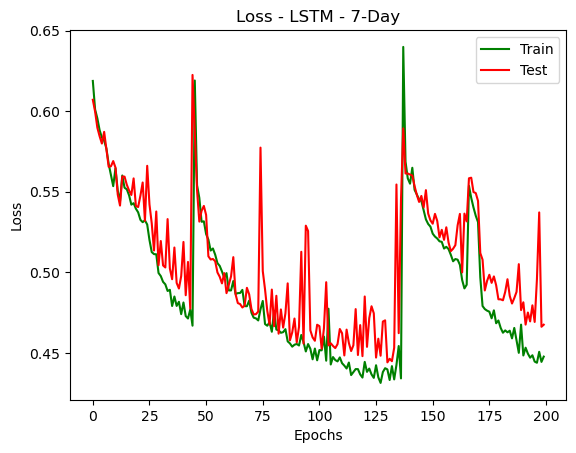

In [67]:
plt.plot(history.epoch, history.history["loss"], 'g', label = "Train")
plt.plot(history.epoch, history.history['val_loss'], 'r', label = "Test")
plt.title('Loss - LSTM - 7-Day')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [68]:
# Evaluating

#Reshaping
#cv_x_dim = np.reshape(cv_x,(cv_x.shape[0],1, train_x.shape[1]))
#test_x_dim = np.reshape(test_x,(test_x.shape[0],1, test_x.shape[1]))

#Predicting 

train_pred_1_day_lstm = [np.argmax(i) for i in model_1_day.predict(train_x_dim)]
cv_pred_1_day_lstm = [np.argmax(i) for i in model_1_day.predict(cv_x_dim)]
test_pred_1_day_lstm = [np.argmax(i) for i in model_1_day.predict(test_x_dim)]

train_pred_3_day_lstm = [np.argmax(i) for i in model_3_day.predict(train_x_dim)]
cv_pred_3_day_lstm = [np.argmax(i) for i in model_3_day.predict(cv_x_dim)]
test_pred_3_day_lstm = [np.argmax(i) for i in model_3_day.predict(test_x_dim)]

train_pred_5_day_lstm = [np.argmax(i) for i in model_5_day.predict(train_x_dim)]
cv_pred_5_day_lstm = [np.argmax(i) for i in model_5_day.predict(cv_x_dim)]
test_pred_5_day_lstm = [np.argmax(i) for i in model_5_day.predict(test_x_dim)]


train_pred_7_day_lstm = [np.argmax(i) for i in model_7_day.predict(train_x_dim)]
cv_pred_7_day_lstm = [np.argmax(i) for i in model_7_day.predict(cv_x_dim)]
test_pred_7_day_lstm = [np.argmax(i) for i in model_7_day.predict(test_x_dim)]

89/89 [==============================] - 0s 1ms/step


In [69]:
#pred 1 day

print("*********** SCORE for 1-DAY predict (Training Data) ***********")
print(classification_report(train_pred_1_day_lstm,train_y_1_day))


print()
print("*********** SCORE for 1-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_1_day_lstm,cv_y_1_day))

*********** SCORE for 1-DAY predict (Training Data) ***********
              precision    recall  f1-score   support

           0       1.00      0.94      0.97      8631
           1       0.02      0.80      0.03        10

    accuracy                           0.94      8641
   macro avg       0.51      0.87      0.50      8641
weighted avg       1.00      0.94      0.97      8641


*********** SCORE for 1-DAY predict (CV Data) ***********
              precision    recall  f1-score   support

           0       1.00      0.94      0.97      2831
           1       0.01      0.25      0.01         4

    accuracy                           0.94      2835
   macro avg       0.50      0.60      0.49      2835
weighted avg       1.00      0.94      0.97      2835



In [70]:
#pred 3 day

print("*********** SCORE for 3-DAY predict (Training Data) ***********")
print(classification_report(train_pred_3_day_lstm,train_y_3_day))


print()
print("*********** SCORE for 3-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_3_day_lstm,cv_y_3_day))

*********** SCORE for 3-DAY predict (Training Data) ***********
              precision    recall  f1-score   support

           0       0.97      0.89      0.93      7942
           1       0.36      0.67      0.47       699

    accuracy                           0.88      8641
   macro avg       0.66      0.78      0.70      8641
weighted avg       0.92      0.88      0.89      8641


*********** SCORE for 3-DAY predict (CV Data) ***********
              precision    recall  f1-score   support

           0       0.96      0.88      0.92      2606
           1       0.32      0.63      0.43       229

    accuracy                           0.86      2835
   macro avg       0.64      0.76      0.67      2835
weighted avg       0.91      0.86      0.88      2835



In [71]:
#pred 5 day

print("*********** SCORE for 5-DAY predict (Training Data)***********")
print(classification_report(train_pred_5_day_lstm,train_y_5_day))


print()
print("*********** SCORE for 5-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_5_day_lstm,cv_y_5_day))

*********** SCORE for 5-DAY predict (Training Data)***********
              precision    recall  f1-score   support

           0       0.86      0.89      0.87      6332
           1       0.67      0.61      0.63      2309

    accuracy                           0.81      8641
   macro avg       0.76      0.75      0.75      8641
weighted avg       0.81      0.81      0.81      8641


*********** SCORE for 5-DAY predict (CV Data) ***********
              precision    recall  f1-score   support

           0       0.85      0.88      0.86      2056
           1       0.65      0.58      0.62       779

    accuracy                           0.80      2835
   macro avg       0.75      0.73      0.74      2835
weighted avg       0.79      0.80      0.80      2835



In [72]:
#pred 7 day

print("*********** SCORE for 7-DAY predict (Training Data)***********")
print(classification_report(train_pred_7_day_lstm,train_y_7_day))


print()
print("*********** SCORE for 7-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_7_day_lstm,cv_y_7_day))

*********** SCORE for 7-DAY predict (Training Data)***********
              precision    recall  f1-score   support

           0       0.91      0.80      0.85      6471
           1       0.56      0.76      0.65      2170

    accuracy                           0.79      8641
   macro avg       0.74      0.78      0.75      8641
weighted avg       0.82      0.79      0.80      8641


*********** SCORE for 7-DAY predict (CV Data) ***********
              precision    recall  f1-score   support

           0       0.90      0.80      0.85      2112
           1       0.56      0.73      0.63       723

    accuracy                           0.78      2835
   macro avg       0.73      0.77      0.74      2835
weighted avg       0.81      0.78      0.79      2835



In [73]:
#Testing

print("*********** SCORE for 1-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_1_day_lstm,test_y_1_day))


print()
print("*********** SCORE for 3-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_3_day_lstm,test_y_3_day))

print()
print("*********** SCORE for 5-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_5_day_lstm,test_y_5_day))

print()
print("*********** SCORE for 7-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_7_day_lstm,test_y_7_day))

*********** SCORE for 1-DAY predict (Testing Data) ***********
              precision    recall  f1-score   support

           0       1.00      0.94      0.97      2831
           1       0.01      0.25      0.01         4

    accuracy                           0.94      2835
   macro avg       0.50      0.60      0.49      2835
weighted avg       1.00      0.94      0.97      2835


*********** SCORE for 3-DAY predict (Testing Data) ***********
              precision    recall  f1-score   support

           0       0.96      0.88      0.92      2606
           1       0.32      0.63      0.43       229

    accuracy                           0.86      2835
   macro avg       0.64      0.76      0.67      2835
weighted avg       0.91      0.86      0.88      2835


*********** SCORE for 5-DAY predict (Testing Data) ***********
              precision    recall  f1-score   support

           0       0.85      0.88      0.86      2056
           1       0.65      0.58      0.62   

### Neural Network - Dense-1

In [ ]:
# Building the model

print(train_x.shape)

model_1_day_dense = Sequential(
    [                
        tf.keras.Input(shape=(389,)),
        layers.Dense(75, activation = 'sigmoid', name = 'layer1'),
        layers.Dense(25, activation = 'linear', name = 'layer2')

    ], name = "ModelDay1" 
)

print(model_1_day_dense.summary())

In [ ]:
# Building the model


model_3_day_dense = Sequential(
    [                
        tf.keras.Input(shape=(389,)),
        layers.Dense(75, activation = 'sigmoid', name = 'layer1'),
        layers.Dense(25, activation = 'linear', name = 'layer2')

    ], name = "ModelDay3" 
)

print(model_3_day_dense.summary())

In [ ]:
# Building the model

model_5_day_dense = Sequential(
    [                
        tf.keras.Input(shape=(389,)),  
        layers.Dense(75, activation = 'sigmoid', name = 'layer1'),
        layers.Dense(25, activation = 'linear', name = 'layer2')

    ], name = "ModelDay5" 
)

print(model_5_day_dense.summary())

In [ ]:
# Building the model

model_7_day_dense = Sequential(
    [                
        tf.keras.Input(shape=(389,)),  
        layers.Dense(75, activation = 'sigmoid', name = 'layer1'),
        layers.Dense(25, activation = 'linear', name = 'layer2')

    ], name = "ModelDay7" 
)

print(model_7_day_dense.summary())

In [ ]:
# Training 

model_1_day_dense.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[keras.metrics.SparseCategoricalAccuracy()]
)

history = model_1_day_dense.fit(
    train_x, train_y_1_day,
    validation_data = (test_x,  test_y_1_day),
    epochs=200
)

In [ ]:
plt.plot(history.epoch, history.history["loss"], 'g', label = "Train")
plt.plot(history.epoch, history.history['val_loss'], 'r', label = "Test")
plt.title('Loss - Dense - 1-Day')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Training 

model_3_day_dense.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[keras.metrics.SparseCategoricalAccuracy()]
)

history = model_3_day_dense.fit(
    train_x, train_y_3_day,
    validation_data = (test_x,  test_y_3_day),
    epochs=200
)

In [ ]:
plt.plot(history.epoch, history.history["loss"], 'g', label = "Train")
plt.plot(history.epoch, history.history['val_loss'], 'r', label = "Test")
plt.title('Loss - Dense - 3-Day')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Training 

model_5_day_dense.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[keras.metrics.SparseCategoricalAccuracy()]
)

history = model_5_day_dense.fit(
    train_x, train_y_5_day,
    validation_data = (test_x,  test_y_5_day),
    epochs=200
)

In [ ]:
plt.plot(history.epoch, history.history["loss"], 'g', label = "Train")
plt.plot(history.epoch, history.history['val_loss'], 'r', label = "Test")
plt.title('Loss - Dense - 5-Day')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Training 

model_7_day_dense.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[keras.metrics.SparseCategoricalAccuracy()]
)

history = model_7_day_dense.fit(
    train_x, train_y_7_day,
    validation_data = (test_x,  test_y_7_day),
    epochs=200
)

In [ ]:
plt.plot(history.epoch, history.history["loss"], 'g', label = "Train")
plt.plot(history.epoch, history.history['val_loss'], 'r', label = "Test")
plt.title('Loss - Dense - 7-Day')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
#Evaluating

#Predicting 

train_pred_1_day_dense= [np.argmax(i) for i in model_1_day_dense.predict(train_x)]
cv_pred_1_day_dense = [np.argmax(i) for i in model_1_day_dense.predict(cv_x)]
test_pred_1_day_dense = [np.argmax(i) for i in model_1_day_dense.predict(test_x)]

train_pred_3_day_dense = [np.argmax(i) for i in model_3_day_dense.predict(train_x)]
cv_pred_3_day_dense = [np.argmax(i) for i in model_3_day_dense.predict(cv_x)]
test_pred_3_day_dense = [np.argmax(i) for i in model_3_day_dense.predict(test_x)]

train_pred_5_day_dense = [np.argmax(i) for i in model_5_day_dense.predict(train_x)]
cv_pred_5_day_dense = [np.argmax(i) for i in model_5_day_dense.predict(cv_x)]
test_pred_5_day_dense = [np.argmax(i) for i in model_5_day_dense.predict(test_x)]

train_pred_7_day_dense = [np.argmax(i) for i in model_7_day_dense.predict(train_x)]
cv_pred_7_day_dense = [np.argmax(i) for i in model_7_day_dense.predict(cv_x)]
test_pred_7_day_dense = [np.argmax(i) for i in model_7_day_dense.predict(test_x)]

In [ ]:
#pred 1 day

print("*********** SCORE for 1-DAY predict (Training Data) ***********")
print(classification_report(train_pred_1_day_dense,train_y_1_day))


print()
print("*********** SCORE for 1-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_1_day_dense,cv_y_1_day))

In [ ]:
#pred 3 day

print("*********** SCORE for 3-DAY predict (Training Data) ***********")
print(classification_report(train_pred_3_day_dense,train_y_3_day))


print()
print("*********** SCORE for 3-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_3_day_dense,cv_y_3_day))

In [ ]:
#pred 5 day

print("*********** SCORE for 5-DAY predict (Training Data) ***********")
print(classification_report(train_pred_5_day_dense,train_y_5_day))

print()
print("*********** SCORE for 5-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_5_day_dense,cv_y_5_day))

In [ ]:
#pred 7 day

print("*********** SCORE for 7-DAY predict (Training Data) ***********")
print(classification_report(train_pred_7_day_dense,train_y_7_day))

print()
print("*********** SCORE for 7-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_7_day_dense,cv_y_7_day))

In [ ]:
#Testing

print()
print("*********** SCORE for 1-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_1_day_dense,test_y_1_day))

print()
print("*********** SCORE for 3-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_3_day_dense,test_y_3_day))

print()
print("*********** SCORE for 5-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_5_day_dense,test_y_5_day))

print()
print("*********** SCORE for 7-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_7_day_dense,test_y_7_day))

### Neural network Dense-2

In [ ]:
# Building the model

print(train_x.shape)

model_1_day_dense = Sequential(
    [                
        tf.keras.Input(shape=(389,)),
        layers.Dense(100, activation = 'sigmoid', name = 'layer1'),
        layers.Dense(25, activation = 'sigmoid', name = 'layer2'),
        layers.Dense(2, activation = 'linear', name = 'layer3')

    ], name = "ModelDay1" 
)

print(model_1_day_dense.summary())

In [ ]:
# Building the model

model_3_day_dense = Sequential(
    [                
        tf.keras.Input(shape=(389,)),  
        layers.Dense(100, activation = 'sigmoid', name = 'layer1'),
        layers.Dense(25, activation = 'sigmoid', name = 'layer2'),
        layers.Dense(2, activation = 'linear', name = 'layer3')

    ], name = "ModelDay3" 
)

print(model_3_day_dense.summary())

In [ ]:
# Building the model

model_5_day_dense = Sequential(
    [                
        tf.keras.Input(shape=(389,)),  
        layers.Dense(100, activation = 'sigmoid', name = 'layer1'),
        layers.Dense(25, activation = 'sigmoid', name = 'layer2'),
        layers.Dense(2, activation = 'linear', name = 'layer3')

    ], name = "ModelDay5" 
)

print(model_5_day_dense.summary())

In [ ]:
# Building the model

model_7_day_dense = Sequential(
    [                
        tf.keras.Input(shape=(389,)),  
        layers.Dense(100, activation = 'sigmoid', name = 'layer1'),
        layers.Dense(25, activation = 'sigmoid', name = 'layer2'),
        layers.Dense(2, activation = 'linear', name = 'layer3')

    ], name = "ModelDay7" 
)

print(model_7_day_dense.summary())

In [ ]:
# Training 

model_1_day_dense.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[keras.metrics.SparseCategoricalAccuracy()]
)

history = model_1_day_dense.fit(
    train_x, train_y_1_day,
    validation_data = (test_x,  test_y_1_day),
    epochs=200
)

In [ ]:
plt.plot(history.epoch, history.history["loss"], 'g', label = "Train")
plt.plot(history.epoch, history.history['val_loss'], 'r', label = "Test")
plt.title('Loss - Dense-2 - 1-Day')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Training 

model_3_day_dense.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[keras.metrics.SparseCategoricalAccuracy()]
)

history = model_3_day_dense.fit(
    train_x, train_y_3_day,
    validation_data = (test_x,  test_y_3_day),
    epochs=200
)

In [ ]:
plt.plot(history.epoch, history.history["loss"], 'g', label = "Train")
plt.plot(history.epoch, history.history['val_loss'], 'r', label = "Test")
plt.title('Loss - Dense-2 - 3-Day')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Training 

model_5_day_dense.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[keras.metrics.SparseCategoricalAccuracy()]
)

history = model_5_day_dense.fit(
    train_x, train_y_5_day,
    validation_data = (test_x,  test_y_5_day),
    epochs=200
)

In [ ]:
plt.plot(history.epoch, history.history["loss"], 'g', label = "Train")
plt.plot(history.epoch, history.history['val_loss'], 'r', label = "Test")
plt.title('Loss - Dense-2 - 5-Day')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Training 

model_7_day_dense.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[keras.metrics.SparseCategoricalAccuracy()]
)

history = model_7_day_dense.fit(
    train_x, train_y_7_day,
    validation_data = (test_x,  test_y_7_day),
    epochs=200
)

In [ ]:
plt.plot(history.epoch, history.history["loss"], 'g', label = "Train")
plt.plot(history.epoch, history.history['val_loss'], 'r', label = "Test")
plt.title('Loss - Dense-2 - 7-Day')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
#Evaluating

#Predicting 

train_pred_1_day_dense= [np.argmax(i) for i in model_1_day_dense.predict(train_x)]
cv_pred_1_day_dense = [np.argmax(i) for i in model_1_day_dense.predict(cv_x)]
test_pred_1_day_dense = [np.argmax(i) for i in model_1_day_dense.predict(test_x)]

train_pred_3_day_dense = [np.argmax(i) for i in model_3_day_dense.predict(train_x)]
cv_pred_3_day_dense = [np.argmax(i) for i in model_3_day_dense.predict(cv_x)]
test_pred_3_day_dense = [np.argmax(i) for i in model_3_day_dense.predict(test_x)]

train_pred_5_day_dense = [np.argmax(i) for i in model_5_day_dense.predict(train_x)]
cv_pred_5_day_dense = [np.argmax(i) for i in model_5_day_dense.predict(cv_x)]
test_pred_5_day_dense = [np.argmax(i) for i in model_5_day_dense.predict(test_x)]

train_pred_7_day_dense = [np.argmax(i) for i in model_7_day_dense.predict(train_x)]
cv_pred_7_day_dense = [np.argmax(i) for i in model_7_day_dense.predict(cv_x)]
test_pred_7_day_dense = [np.argmax(i) for i in model_7_day_dense.predict(test_x)]

In [ ]:
#pred 1 day

print("*********** SCORE for 1-DAY predict (Training Data) ***********")
print(classification_report(train_pred_1_day_dense,train_y_1_day))


print()
print("*********** SCORE for 1-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_1_day_dense,cv_y_1_day))

In [ ]:
#pred 3 day

print("*********** SCORE for 3-DAY predict (Training Data) ***********")
print(classification_report(train_pred_3_day_dense,train_y_3_day))


print()
print("*********** SCORE for 1-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_3_day_dense,cv_y_3_day))

In [ ]:
#pred 5 day

print("*********** SCORE for 5-DAY predict (Training Data) ***********")
print(classification_report(train_pred_5_day_dense,train_y_5_day))

print()
print("*********** SCORE for 5-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_5_day_dense,cv_y_5_day))

In [ ]:
#pred 7 day

print("*********** SCORE for 7-DAY predict (Training Data) ***********")
print(classification_report(train_pred_7_day_dense,train_y_7_day))

print()
print("*********** SCORE for 7-DAY predict (CV Data) ***********")
print(classification_report(cv_pred_7_day_dense,cv_y_7_day))

In [ ]:
#Testing

print("*********** SCORE for 1-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_1_day_dense,test_y_1_day))

print()
print("*********** SCORE for 3-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_3_day_dense,test_y_3_day))

print()
print("*********** SCORE for 5-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_5_day_dense,test_y_5_day))

print()
print("*********** SCORE for 7-DAY predict (Testing Data) ***********")
print(classification_report(test_pred_7_day_dense,test_y_7_day))